# Lunar Lander Report


<center>Fernando Cesar Akune</center>
<p>
<center>Marcelo Pederiva</center>
<p>
<center>Matheus Almeida</center>
<center>Ivan Lima</center>
<p>

# 1 Truco

 For the final project we choose another environment to tackle: the **Lunar Lander V2** available at OpenAI gym. We considered continue working with **Truco**, however, how we have developed it from the scratch, its environment is not suitable to the stable deep learning algorithms already available.  In our first attempt to run the **DQN** with **Truco**, we saw that adapting  the environment would be time-consuming.  Furthermore, **OpenAi gym** environments are already suitable to **Box2D**, which is helpful to show the reinforcement learning animation in a video.

# 2 Lunar Lander V2

Lunar Lander environment, as the name suggests, consists of an environment where a spaceship attempts to land on the moon. Based on some policy and on the current state, the agent takes discrete actions 
 attempting to touch the surface of the moon at a particular location (landing pad), and speed (landing speed). The spaceship is equipped with center (main), left and right engines, therefore the agent can take four actions: it can power one of the engines, or it can do nothing. Notice that powering the left or the right engines produces a rotation in the spaceship.  
The state is continuous, and it is characterized by 8 variables:


1.   $x$ (coordinate of the spaceship) 
2.   $y$ (coordinate of the spaceship)
3.   $v_x$ (the horizontal velocity) 
4.   $v_y$ (the vertical velocity) 
5.   $\theta$  (the orientation in space) 
6.   $v_\theta$ (the angular velocity) 
7.   Left leg touching the moon surface (Boolean) 
8.   Right leg touching the moon surface (Boolean)

It is a 2D framework with the origin of the coordinate system placed in the middle of the lower corner of the window, coincident with the landing target location. All $y$ coordinates are positive. Right $x$ coordinates are positive, while left $x$ coordinate are negative.

Regarding the rewards, quoting OpenAI: “*reward for moving from the top of the screen to landing pad and zero speed is about 100..140 points. If lander moves away from landing pad it loses reward back. Episode finishes if the lander crashes or comes to rest, receiving additional -100 or +100 points. Each leg ground contact is +10. Firing main engine is -0.3 points each frame. Solved is 200 points. Landing outside landing pad is possible. Fuel is infinite, so an agent can learn to fly and then land on its first attempt.*


In summary, our problem is an episodic and deterministic Markov Decision Process. It is episodic because it has terminal state, being smooth landing or crash failure. It is deterministic in the sense that each action taken leads to changing in the state accordantly. For further investigations, we modified the environment adding uncertainties. Those attempts aim to test the robustness of the algorithms in a partially observed Markov Decision Process (randomness added). A detailed description of each modified environment is provided later.    


# 3 Off Policy vs On Policy

## 3.1 DQN

Deep Q-Network (DQN) is the first deep reinforcement learning method proposed by DeepMind. It provides four main improvements: experience replay, target network, clipping rewards, and skipping frames.

**Experience replay** stores “experiences” (state transitions, rewards and actions) essential data to perform Q learning through mini-batches to update neural networks. This technique reduces correlation between experiences in updating DNN, increases learning speed with mini-batches, and reuses past transitions to avoid undesirable forgetting. **Target network** technique fixes parameters of target function and replaces them with the latest network every thousand steps. It decreases the instability of the target function and makes the training easier. The **clipping rewards** technique clips scores. All positive rewards are set +1 and all negative rewards are set -1, making training more stable. At last, but not least, AI doesn’t need to calculate Q values every frame. **Skipping frames** technique reduces computational cost and gathers more experiences. DQN calculates Q values every four frames and use past four frames as inputs.

Double-DQN algorithm utilizes a Double Q-learning to reduce overestimation by decomposing the max operation in the target into action selection and action evaluation. The greedy policy is evaluated according to the online network, but it uses the target network to estimate its value. The target is now as follows:

\begin{aligned}
Y_{t}^{\text {DoubleDQN }}=R_{t+1}+\gamma Q\left(S_{t+1}, \arg \max _{a} Q\left(S_{t+1}, a ; \theta_{t}\right) ; \theta_{t}^{-}\right)
\end{aligned}

The weights of the second network $ {\theta_t^,}$ are replaced with the weights of the target network ${\theta_t^-}$ for the evaluation of the current greedy policy.

In the dueling architecture, a new network  represents two separate estimators:
one for the state value function and one for
the state-dependent action advantage function.


## 3.2 A2C

A2C method belongs to Actor-Critic family. This family of algorithm  combines the advantages of policy-based and value-based methods by using two sets of parameters. The parameter **$w$** in order to update the action-value function, and the parameter **$\theta$** in order to update the policy. The first one works like a **“critic”** who tells the second one, the **“actor”**, the best way to perform. In summary, **actor-critic** algorithms follow an **approximate** policy gradient as described below:

\begin{aligned}
\nabla_{\theta} J(\theta) & \approx \mathbb{E}_{\pi_{\theta}}\left[\nabla_{\theta} \log \pi_{\theta}(s, a) Q_{w}(s, a)\right] \\
\Delta \theta &=\alpha \nabla_{\theta} \log \pi_{\theta}(s, a) Q_{w}(s, a)
\end{aligned}

A2C, or Advantage Actor Critic, is a version of the A3C policy gradient method. As an alternative to the asynchronous implementation of A3C, A2C is a synchronous and deterministic implementation that waits for each actor to finish its segment of experience before updating, averaging over all of the actors. 

# 4 Hyperparameters of the Methods

## 4.1 DQN

As presented by Stable-baselines package, the Deep Q Network (DQN)

> DQN

* Policy: The policy model to use, MLP or MLP with layer normalization
* Double-Q Learning: Whether to enable Double-Q learning or not
* Dueling DQN: Whether to enable dueling extensions or not
    
> A2C

For the agent based on Actor-Critic, different configurations were compared for the following parameters:

* Learning Rate: For this measure, three values will be compared, 0.0007, 0.007, 0.015.

* Learning Rate Schedule: This parameter defines which approach will be used to update the learning rate. In the experiments, two approaches will be compared, the Constant Schedule, where the learning rate is not modified during training, and the Linear Schedule, in which the learning rate starts as 1.0 and is updated from linear interpolation to a learning value minimum rate, which in this work is 0.0007.

* Policy: Define the policy model used by the agent. Defines the policy model used by the agent. Three models were compared, the MLP, which is a neural network with multiple layers, the MLP with LSTM, which uses the recurrent network LSTM together with MLP, and the MLP with layer normalization together with LSTM. 



# 5 Environments

## 5.1 Env 1 - Default

The Env1 is the default environment provided by LunarLander v2.

## 5.2 Env 2 - Noise in X Position

To difficult the lander task performance in the learning process, we proposed a noise implementation in the state readings. In this way, this first modified environment (Env2) had an implementation of Gaussian noise (Equation 1) in the X position of the state.

$ p(x) = \frac{1}{\sqrt{2\pi\sigma^2}}e^{- \frac{(x-\mu)^2}{2\sigma^2}}                    $Equation 1

The Gaussian noise parameters were determined to do not completely confuse the machine in the learning process. As a result, it was implemented a Gaussian noise with a mean($\mu)$ = 0 and a standard deviation($\sigma$) = 0.2.

## 5.3 Env 3 - Percent in X Velocity

Seeking to difficult the learning process, in Env 3, we implemented an uncertainty in the information of X velocity. 

In this environment, the state returns a probabilistic percent of the real x velocity. In other words, the state returns a random percent, between 70% and 100% of the real x velocity value.

## 5.4 Env 4 - Different Engine Reward

Based on the real rocket landings, the use of the fuel needs to be controlled, using the minimum possible. Observing the results of the normal environment, we propose to increase the negative reward of the use of the engine. 

Seeking the rocket to use the thrustle only in the high necessity, in Env 4, we propose to change the engine reward, from -0.3 to -0.6 in each use. 

## 5.5 Env 5 - Engine Failure

Another modification proposed in the environment was related to the environment's lack of response to the agent's action. Where in 20% of the agent's attempts, the environment will become a null action, that is, the engine will not work at the moment. This modification will be important to analyze the models' ability to deal with adversity that is the probability of the action not being carried out.

## 5.6 Env 6 - Engine Failure with a different Reward
For this type of environment, a modification in the rewards was also proposed to penalize the use of the engines. It increases the complexity of the problem because in addition to the agent managing the unpredictability of the engine, he will be taught  to use it efficiently as well.

##In summary:

*   env01:   OpenAI gym Lunar Lander V2 default environment  
*   env02:   Gaussian noise in $x$  position, with $\mu=0$, and $\sigma=0.2$ 
*   env03:   $70\%$ to $100\%$  $v_x$ real velocity
*   env04:   engine reward set to -$0.6$            
*   env05:   $20\%$ engine failure                    
*   env06:   $20\%$ engine failure with -$0.6$ engine reward 

# 6 LFA Q-Learning

Seeking to observe one of the methods of the first project, we chose the LFA Q-Learning to perform this task. The linear approximator model will be compared to the non-linear DQN.

# 7 Code

## 7.1 Installation

In [ ]:
!pip install gym 
!pip install collections 
!pip install box2d 

!pip install Keras-Applications==1.0.8
!pip install Keras-Preprocessing==1.1.0
!pip install stable-baselines==2.10.0
!pip install tensorboard==1.12.0
!pip install tensorflow==1.12.0


!apt-get install -y xvfb python-opengl > /dev/null 2>&1 
!pip install gym pyvirtualdisplay > /dev/null 2>&1  
!apt-get install swig cmake libopenmpi-dev zlib1g-dev xvfb x11-utils ffmpeg 

ERROR: Could not find a version that satisfies the requirement collections (from versions: none)
ERROR: No matching distribution found for collections
     |████████████████████████████████| 1.3MB 11.9MB/s 
     |████████████████████████████████| 51kB 3.9MB/s 
     |████████████████████████████████| 51kB 3.9MB/s 
ERROR: tensorflow 2.4.0 has requirement keras-preprocessing~=1.1.2, but you'll have keras-preprocessing 1.1.0 which is incompatible.
  Found existing installation: Keras-Preprocessing 1.1.2
    Uninstalling Keras-Preprocessing-1.1.2:
      Successfully uninstalled Keras-Preprocessing-1.1.2
     |████████████████████████████████| 256kB 9.0MB/s 
     |████████████████████████████████| 3.1MB 11.3MB/s 
ERROR: tensorflow 2.4.0 has requirement keras-preprocessing~=1.1.2, but you'll have keras-preprocessing 1.1.0 which is incompatible.
ERROR: tensorflow 2.4.0 has requirement tensorboard~=2.4, but you'll have tensorboard 1.12.0 which is incompatible.
  Found existing installation: ten

## 7.2 Imports

In [ ]:
import gym

from stable_baselines.common.vec_env import DummyVecEnv
from stable_baselines.deepq.policies import MlpPolicy
from stable_baselines import DQN, A2C
from stable_baselines.common.vec_env import VecVideoRecorder, SubprocVecEnv, DummyVecEnv

from pathlib import Path
import imageio
import numpy as np
import base64
import IPython
import PIL.Image
from IPython import display as ipythondisplay
import pyvirtualdisplay
from IPython.display import Image
import matplotlib.pyplot as plt
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

from google.colab import drive
import pandas as pd

from gym.wrappers import Monitor
import sklearn
from sklearn.linear_model import SGDRegressor
import sklearn.pipeline
import itertools
import sys

/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:523: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:524: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:525: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:526: FutureWarning: Passing (type, 1) or 

In [ ]:
def evaluate(model, num_steps=1000):
  """
  Evaluate a RL agent
  :param model: (BaseRLModel object) the RL Agent
  :param num_steps: (int) number of timesteps to evaluate it
  :return: (float) Mean reward for the last 100 episodes
  """
  episode_rewards = [0.0]
  obs = env.reset()
  for i in range(num_steps):
      # _states are only useful when using LSTM policies
      action, _states = model.predict(obs)

      obs, reward, done, info = env.step(action)
      
      # Stats
      episode_rewards[-1] += reward
      if done:
          obs = env.reset()
          episode_rewards.append(0.0)
  # Compute mean reward for the last 100 episodes
  mean_100ep_reward = round(np.mean(episode_rewards[-100:]), 1)
  print("Mean reward:", mean_100ep_reward, "Num episodes:", len(episode_rewards))
  
  return mean_100ep_reward

In [ ]:
import os
os.system("Xvfb :1 -screen 0 1024x768x24 &")
os.environ['DISPLAY'] = ':1'

In [ ]:
# Record video
def record_video(env_id, model, video_length=500, prefix='', video_folder='videos/'):
  """
  :param env_id: (str)
  :param model: (RL model)
  :param video_length: (int)
  :param prefix: (str)
  :param video_folder: (str)
  """
  eval_env = DummyVecEnv([lambda: gym.make('LunarLander-v2')])
  # Start the video at step=0 and record 500 steps
  eval_env = VecVideoRecorder(env, video_folder=video_folder,
                              record_video_trigger=lambda step: step == 0, video_length=video_length,
                              name_prefix=prefix)

  obs = eval_env.reset()
  for _ in range(video_length):
    action, _ = model.predict(obs)
    obs, _, _, _ = eval_env.step(action)

  # Close the video recorder
  eval_env.close()

In [ ]:
# Display video
def show_videos(video_path='', prefix=''):
  html = []
  for mp4 in Path(video_path).glob("{}*.mp4".format(prefix)):
      video_b64 = base64.b64encode(mp4.read_bytes())
      html.append('''<video alt="{}" autoplay 
                    loop controls style="height: 400px;">
                    <source src="data:video/mp4;base64,{}" type="video/mp4" />
                </video>'''.format(mp4, video_b64.decode('ascii')))
  ipythondisplay.display(ipythondisplay.HTML(data="<br>".join(html)))

In [ ]:
# exponential moving average
def smooth(scalars, weight):  # Weight between 0 and 1
    last = scalars[0]  # First value in the plot (first timestep)
    smoothed = list()
    for point in scalars:
        smoothed_val = last * weight + (1 - weight) * point  # Calculate smoothed value
        smoothed.append(smoothed_val)                        # Save it
        last = smoothed_val                                  # Anchor the last smoothed value

    return smoothed

In [ ]:
def plot_csv(title, smooth_weight, files):
    
    plt.figure(figsize=(20,10))
    
    for f,l in files:
        df = pd.read_csv(f, header=0)
        plt.plot(df['Step'], smooth(df['Value'], smooth_weight), label=l)
        #plt.plot(df['Step'], df['Value'], alpha=0.1)

    plt.title(title)
    #plt.ylim([-500, 300])
    plt.xlabel('Step')
    plt.ylabel('Reward')
    plt.grid('on')
    plt.legend(loc='best')

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
%cd /content/drive/MyDrive/Resultados-LunarLander/

/content/drive/.shortcut-targets-by-id/1FHgca_-DQRSq1HC0HLbO0szU-d9k9d8C/Resultados-LunarLander


## 7.3 LFA Q-Learning

In [ ]:
env = gym.make('LunarLander-v2')

In [ ]:
# https://github.com/Kirili4ik/Lunar-lander-v2/blob/master/lunar_lander_v2_att1.ipynb
# Learning to scale features from state by some samples 
observation_examples = np.array([env.observation_space.sample()[:-2] for x in range(10000)])
scaler = sklearn.preprocessing.StandardScaler()
scaler.fit(observation_examples)

StandardScaler(copy=True, with_mean=True, with_std=True)

In [ ]:
# Kind of linear approximator for Q-learning
class Estimator():

    # Create a linear model for every action in action space
    def __init__(self):
        self.models = []
        for i in range(env.action_space.n):
            model = SGDRegressor()
            model.partial_fit([self.featurize_state(env.reset())], [0])
            self.models.append(model)
    
    # Creates features from state
    def featurize_state(self, state):
        # [:-2] is for not scaling binary 
        scaled = scaler.transform(state[:-2].reshape(1, -1))
        return np.concatenate((scaled[0], state[-2:], [1]), axis=None)
    
    # Predicts for every action in given state
    def predict(self, s):
        features = self.featurize_state(s)
        return np.array([m.predict([features])[0] for m in self.models])
    
    # Updates parameters for a given state and action with y
    def update(self, s, a, y):
        features = self.featurize_state(s)
        self.models[a].partial_fit([features], [y])

In [ ]:
# returns funcion that gives by given state 
def e_greedy_policy(estimator, eps, num_actions):
    def policy_fn(observation):
        actions = np.ones(num_actions, dtype=float) * eps / num_actions
        q_values = estimator.predict(observation)
        best_action = np.argmax(q_values)
        actions[best_action] += (1.0 - eps)
        return actions
    return policy_fn

In [ ]:
def q_learning(env, estimator, total_timesteps, disc_fac=1, eps=0.1, eps_dec=0.99, alpha=0.1):
    
    all_stats = [0.0]
    steps = [0]

    new_q = 0
    
    ep_num = 0
    num_timesteps = 0
    while (num_timesteps < total_timesteps):
        
        # eps-greedy policy
        policy_func = e_greedy_policy(
            estimator, eps * eps_dec**(ep_num/10), env.action_space.n)

        observation = env.reset()

        # steps in the environment
        for t in itertools.count():
            #env.render()
            
            # choose action using e-greedy policy
            action_probs = policy_func(observation)
            action = np.random.choice(np.arange(len(action_probs)), p=action_probs)

            # step
            observation_, reward, done, info = env.step(action)

            # update stats
            all_stats[ep_num] += reward
            
            # prediction
            q_values_next = estimator.predict(observation_)
            
            # formula for updating q-func value using alpha=0.1
            #q_a_now = estimator.predict(observation)[action]
            new_q = new_q + alpha * (reward + disc_fac * np.max(q_values_next) - new_q)
            
            # update func approximator with our target
            estimator.update(observation, action, new_q)
            
            # increment timesteps
            num_timesteps += 1

            print("\rStep {} @ Episode {}".format
                   (num_timesteps, ep_num + 1), end="")

            if done:
                steps[ep_num] = num_timesteps      
                ep_num += 1   
                all_stats.append(0.0)
                steps.append(0)
                break
            
            observation = observation_

        if (ep_num % 10 == 0):
            print(' mean reward_sum=', np.mean(all_stats[ep_num - 10:ep_num]))
        
    env.close()
    return all_stats, steps

In [ ]:
estimator = Estimator()

In [ ]:
q_r, q_s = q_learning(env, estimator, total_timesteps=200000)

Step 1326 @ Episode 10 mean reward_sum= -225.19881530241872
Step 2606 @ Episode 20 mean reward_sum= -183.61950470113484
Step 3709 @ Episode 30 mean reward_sum= -144.531903571574
Step 4842 @ Episode 40 mean reward_sum= -238.97364656822214
Step 6051 @ Episode 50 mean reward_sum= -206.31223345116047
Step 7115 @ Episode 60 mean reward_sum= -74.73395978431799
Step 8422 @ Episode 70 mean reward_sum= -173.06327749807275
Step 9812 @ Episode 80 mean reward_sum= -177.9018196646614
Step 10925 @ Episode 90 mean reward_sum= -229.7743621395643
Step 11933 @ Episode 100 mean reward_sum= -307.1214306244605
Step 12914 @ Episode 110 mean reward_sum= -193.95443696468772
Step 14165 @ Episode 120 mean reward_sum= -219.55115024038696
Step 15227 @ Episode 130 mean reward_sum= -195.10552996770414
Step 15992 @ Episode 140 mean reward_sum= -204.7024172951701
Step 16906 @ Episode 150 mean reward_sum= -190.41581347152072
Step 18007 @ Episode 160 mean reward_sum= -195.4299154399957
Step 19197 @ Episode 170 mean rew

In [ ]:
df_lfa_q_learning = pd.DataFrame({'Step': q_s[0:-1], 'Value': q_r[0:-1]})

## 7.4 Default Environment (Env 1)

In [ ]:
video_folder = '/videos'
video_length = 100

# set our inital enviorment
env = DummyVecEnv([lambda: gym.make('LunarLander-v2')])
obs = env.reset()

## 7.5 DQN

In [ ]:
model_dqn = DQN(MlpPolicy, env, verbose=1, tensorboard_log="./dqn_lunarlander_tensorboard/")

In [ ]:
# Train model
model_dqn.learn(total_timesteps=200000, tb_log_name='Double_DQN_MlpPolicy')

# Save model
model_dqn.save("dqn_deeplunar")

--------------------------------------
| % time spent exploring  | 13       |
| episodes                | 100      |
| mean 100 episode reward | -91.1    |
| steps                   | 17620    |
--------------------------------------
--------------------------------------
| % time spent exploring  | 2        |
| episodes                | 200      |
| mean 100 episode reward | 18.5     |
| steps                   | 98854    |
--------------------------------------
--------------------------------------
| % time spent exploring  | 2        |
| episodes                | 300      |
| mean 100 episode reward | 151      |
| steps                   | 154940   |
--------------------------------------
--------------------------------------
| % time spent exploring  | 2        |
| episodes                | 400      |
| mean 100 episode reward | 77.8     |
| steps                   | 191362   |
--------------------------------------


In [ ]:
# Record & show video
record_video('LunarLander-v2', model_dqn, video_length=1500, prefix='dqn_deeplunar')
show_videos('videos', prefix='dqn_deeplunar')

In [ ]:
# Hyperparameters exploration of the DQN
# policy: The policy model to use (MlpPolicy, LnMlpPolicy)
# double_q: Whether to enable Double-Q learning or not. 
# dueling: Whether to enable dueling extensions or not.

model_dqn = DQN(LnMlpPolicy, env, verbose=1, tensorboard_log="./dqn_lunarlander_tensorboard/")
model_dqn.learn(total_timesteps=200000, tb_log_name='Double_DQN_LnMlpPolicy')
model_dqn.save("Double_DQN_LnMlpPolicy")

model_dqn = DQN(MlpPolicy, env, verbose=1, tensorboard_log="./dqn_lunarlander_tensorboard/", policy_kwargs=dict(dueling=False))
model_dqn.learn(total_timesteps=200000, tb_log_name='Double_DQN_MlpPolicy_dueling_False')
model_dqn.save("Double_DQN_MlpPolicy_dueling_False")

model_dqn = DQN(LnMlpPolicy, env, verbose=1, tensorboard_log="./dqn_lunarlander_tensorboard/", policy_kwargs=dict(dueling=False))
model_dqn.learn(total_timesteps=200000, tb_log_name='Double_DQN_LnMlpPolicy_dueling_False'')
model_dqn.save("Double_DQN_LnMlpPolicy_dueling_False'")

model_dqn = DQN(MlpPolicy, env, verbose=1, tensorboard_log="./dqn_lunarlander_tensorboard/", double_q=False)
model_dqn.learn(total_timesteps=200000, tb_log_name='DQN_MlpPolicy')
model_dqn.save("DQN_MlpPolicy")

model_dqn = DQN(LnMlpPolicy, env, verbose=1, tensorboard_log="./dqn_lunarlander_tensorboard/", double_q=False)
model_dqn.learn(total_timesteps=200000, tb_log_name='DQN_LnMlpPolicy')
model_dqn.save("DQN_LnMlpPolicy")

model_dqn = DQN(MlpPolicy, env, verbose=1, tensorboard_log="./dqn_lunarlander_tensorboard/", double_q=False, policy_kwargs=dict(dueling=False))
model_dqn.learn(total_timesteps=200000, tb_log_name='DQN_MlpPolicy_dueling_False')
model_dqn.save("DQN_MlpPolicy_dueling_False")

model_dqn = DQN(LnMlpPolicy, env, verbose=1, tensorboard_log="./dqn_lunarlander_tensorboard/", double_q=False, policy_kwargs=dict(dueling=False))
model_dqn.learn(total_timesteps=200000, tb_log_name='DQN_LnMlpPolicy_dueling_False'')
model_dqn.save("DQN_LnMlpPolicy_dueling_False'")


## 7.6 A2C

In [ ]:
model_a2c = A2C('MlpPolicy', env, verbose=1, tensorboard_log="./a2c_lunarlander_tensorboard/")

In [ ]:
model_a2c.learn(total_timesteps=200000)

# Save model
model_a2c.save("a2c_deeplunar")

In [ ]:
record_video('LunarLander-v2', model_a2c, video_length=1500, prefix='a2c_deeplunar')
show_videos('videos', prefix='a2c_deeplunar')

## 7.7 Env 2


In [ ]:
import sys, math
import numpy as np

import Box2D
from Box2D.b2 import (edgeShape, circleShape, fixtureDef, polygonShape, revoluteJointDef, contactListener)

import gym
from gym import spaces
from gym.utils import seeding, EzPickle

FPS = 50
SCALE = 30.0   # affects how fast-paced the game is, forces should be adjusted as well

MAIN_ENGINE_POWER = 13.0
SIDE_ENGINE_POWER = 0.6

INITIAL_RANDOM = 1000.0   # Set 1500 to make game harder

LANDER_POLY =[
    (-14, +17), (-17, 0), (-17 ,-10),
    (+17, -10), (+17, 0), (+14, +17)
    ]
LEG_AWAY = 20
LEG_DOWN = 18
LEG_W, LEG_H = 2, 8
LEG_SPRING_TORQUE = 40

SIDE_ENGINE_HEIGHT = 14.0
SIDE_ENGINE_AWAY = 12.0

VIEWPORT_W = 600
VIEWPORT_H = 400


class ContactDetector(contactListener):
    def __init__(self, env):
        contactListener.__init__(self)
        self.env = env

    def BeginContact(self, contact):
        if self.env.lander == contact.fixtureA.body or self.env.lander == contact.fixtureB.body:
            self.env.game_over = True
        for i in range(2):
            if self.env.legs[i] in [contact.fixtureA.body, contact.fixtureB.body]:
                self.env.legs[i].ground_contact = True

    def EndContact(self, contact):
        for i in range(2):
            if self.env.legs[i] in [contact.fixtureA.body, contact.fixtureB.body]:
                self.env.legs[i].ground_contact = False


class LunarLander2(gym.Env, EzPickle):
    metadata = {
        'render.modes': ['human', 'rgb_array'],
        'video.frames_per_second' : FPS
    }

    continuous = False

    def __init__(self):
        EzPickle.__init__(self)
        self.seed()
        self.viewer = None

        self.world = Box2D.b2World()
        self.moon = None
        self.lander = None
        self.particles = []

        self.prev_reward = None

        # useful range is -1 .. +1, but spikes can be higher
        self.observation_space = spaces.Box(-np.inf, np.inf, shape=(8,), dtype=np.float32)

        if self.continuous:
            # Action is two floats [main engine, left-right engines].
            # Main engine: -1..0 off, 0..+1 throttle from 50% to 100% power. Engine can't work with less than 50% power.
            # Left-right:  -1.0..-0.5 fire left engine, +0.5..+1.0 fire right engine, -0.5..0.5 off
            self.action_space = spaces.Box(-1, +1, (2,), dtype=np.float32)
        else:
            # Nop, fire left engine, main engine, right engine
            self.action_space = spaces.Discrete(4)

        self.reset()

    def seed(self, seed=None):
        self.np_random, seed = seeding.np_random(seed)
        return [seed]

    def _destroy(self):
        if not self.moon: return
        self.world.contactListener = None
        self._clean_particles(True)
        self.world.DestroyBody(self.moon)
        self.moon = None
        self.world.DestroyBody(self.lander)
        self.lander = None
        self.world.DestroyBody(self.legs[0])
        self.world.DestroyBody(self.legs[1])

    def reset(self):
        self._destroy()
        self.world.contactListener_keepref = ContactDetector(self)
        self.world.contactListener = self.world.contactListener_keepref
        self.game_over = False
        self.prev_shaping = None

        W = VIEWPORT_W/SCALE
        H = VIEWPORT_H/SCALE

        # terrain
        CHUNKS = 11
        height = self.np_random.uniform(0, H/2, size=(CHUNKS+1,))
        chunk_x = [W/(CHUNKS-1)*i for i in range(CHUNKS)]
        self.helipad_x1 = chunk_x[CHUNKS//2-1]
        self.helipad_x2 = chunk_x[CHUNKS//2+1]
        self.helipad_y = H/4
        height[CHUNKS//2-2] = self.helipad_y
        height[CHUNKS//2-1] = self.helipad_y
        height[CHUNKS//2+0] = self.helipad_y
        height[CHUNKS//2+1] = self.helipad_y
        height[CHUNKS//2+2] = self.helipad_y
        smooth_y = [0.33*(height[i-1] + height[i+0] + height[i+1]) for i in range(CHUNKS)]

        self.moon = self.world.CreateStaticBody(shapes=edgeShape(vertices=[(0, 0), (W, 0)]))
        self.sky_polys = []
        for i in range(CHUNKS-1):
            p1 = (chunk_x[i], smooth_y[i])
            p2 = (chunk_x[i+1], smooth_y[i+1])
            self.moon.CreateEdgeFixture(
                vertices=[p1,p2],
                density=0,
                friction=0.1)
            self.sky_polys.append([p1, p2, (p2[0], H), (p1[0], H)])

        self.moon.color1 = (0.0, 0.0, 0.0)
        self.moon.color2 = (0.0, 0.0, 0.0)

        initial_y = VIEWPORT_H/SCALE
        self.lander = self.world.CreateDynamicBody(
            position=(VIEWPORT_W/SCALE/2, initial_y),
            angle=0.0,
            fixtures = fixtureDef(
                shape=polygonShape(vertices=[(x/SCALE, y/SCALE) for x, y in LANDER_POLY]),
                density=5.0,
                friction=0.1,
                categoryBits=0x0010,
                maskBits=0x001,   # collide only with ground
                restitution=0.0)  # 0.99 bouncy
                )
        self.lander.color1 = (0.5, 0.4, 0.9)
        self.lander.color2 = (0.3, 0.3, 0.5)
        self.lander.ApplyForceToCenter( (
            self.np_random.uniform(-INITIAL_RANDOM, INITIAL_RANDOM),
            self.np_random.uniform(-INITIAL_RANDOM, INITIAL_RANDOM)
            ), True)

        self.legs = []
        for i in [-1, +1]:
            leg = self.world.CreateDynamicBody(
                position=(VIEWPORT_W/SCALE/2 - i*LEG_AWAY/SCALE, initial_y),
                angle=(i * 0.05),
                fixtures=fixtureDef(
                    shape=polygonShape(box=(LEG_W/SCALE, LEG_H/SCALE)),
                    density=1.0,
                    restitution=0.0,
                    categoryBits=0x0020,
                    maskBits=0x001)
                )
            leg.ground_contact = False
            leg.color1 = (0.5, 0.4, 0.9)
            leg.color2 = (0.3, 0.3, 0.5)
            rjd = revoluteJointDef(
                bodyA=self.lander,
                bodyB=leg,
                localAnchorA=(0, 0),
                localAnchorB=(i * LEG_AWAY/SCALE, LEG_DOWN/SCALE),
                enableMotor=True,
                enableLimit=True,
                maxMotorTorque=LEG_SPRING_TORQUE,
                motorSpeed=+0.3 * i  # low enough not to jump back into the sky
                )
            if i == -1:
                rjd.lowerAngle = +0.9 - 0.5  # The most esoteric numbers here, angled legs have freedom to travel within
                rjd.upperAngle = +0.9
            else:
                rjd.lowerAngle = -0.9
                rjd.upperAngle = -0.9 + 0.5
            leg.joint = self.world.CreateJoint(rjd)
            self.legs.append(leg)

        self.drawlist = [self.lander] + self.legs

        return self.step(np.array([0, 0]) if self.continuous else 0)[0]

    def _create_particle(self, mass, x, y, ttl):
        p = self.world.CreateDynamicBody(
            position = (x, y),
            angle=0.0,
            fixtures = fixtureDef(
                shape=circleShape(radius=2/SCALE, pos=(0, 0)),
                density=mass,
                friction=0.1,
                categoryBits=0x0100,
                maskBits=0x001,  # collide only with ground
                restitution=0.3)
                )
        p.ttl = ttl
        self.particles.append(p)
        self._clean_particles(False)
        return p

    def _clean_particles(self, all):
        while self.particles and (all or self.particles[0].ttl < 0):
            self.world.DestroyBody(self.particles.pop(0))

    def step(self, action):
        if self.continuous:
            action = np.clip(action, -1, +1).astype(np.float32)
        else:
            assert self.action_space.contains(action), "%r (%s) invalid " % (action, type(action))

        # Engines
        tip  = (math.sin(self.lander.angle), math.cos(self.lander.angle))
        side = (-tip[1], tip[0])
        dispersion = [self.np_random.uniform(-1.0, +1.0) / SCALE for _ in range(2)]

        m_power = 0.0
        if (self.continuous and action[0] > 0.0) or (not self.continuous and action == 2):
            # Main engine
            if self.continuous:
                m_power = (np.clip(action[0], 0.0,1.0) + 1.0)*0.5   # 0.5..1.0
                assert m_power >= 0.5 and m_power <= 1.0
            else:
                m_power = 1.0
            ox = (tip[0] * (4/SCALE + 2 * dispersion[0]) +
                  side[0] * dispersion[1])  # 4 is move a bit downwards, +-2 for randomness
            oy = -tip[1] * (4/SCALE + 2 * dispersion[0]) - side[1] * dispersion[1]
            impulse_pos = (self.lander.position[0] + ox, self.lander.position[1] + oy)
            p = self._create_particle(3.5,  # 3.5 is here to make particle speed adequate
                                      impulse_pos[0],
                                      impulse_pos[1],
                                      m_power)  # particles are just a decoration
            p.ApplyLinearImpulse((ox * MAIN_ENGINE_POWER * m_power, oy * MAIN_ENGINE_POWER * m_power),
                                 impulse_pos,
                                 True)
            self.lander.ApplyLinearImpulse((-ox * MAIN_ENGINE_POWER * m_power, -oy * MAIN_ENGINE_POWER * m_power),
                                           impulse_pos,
                                           True)

        s_power = 0.0
        if (self.continuous and np.abs(action[1]) > 0.5) or (not self.continuous and action in [1, 3]):
            # Orientation engines
            if self.continuous:
                direction = np.sign(action[1])
                s_power = np.clip(np.abs(action[1]), 0.5, 1.0)
                assert s_power >= 0.5 and s_power <= 1.0
            else:
                direction = action-2
                s_power = 1.0
            ox = tip[0] * dispersion[0] + side[0] * (3 * dispersion[1] + direction * SIDE_ENGINE_AWAY/SCALE)
            oy = -tip[1] * dispersion[0] - side[1] * (3 * dispersion[1] + direction * SIDE_ENGINE_AWAY/SCALE)
            impulse_pos = (self.lander.position[0] + ox - tip[0] * 17/SCALE,
                           self.lander.position[1] + oy + tip[1] * SIDE_ENGINE_HEIGHT/SCALE)
            p = self._create_particle(0.7, impulse_pos[0], impulse_pos[1], s_power)
            p.ApplyLinearImpulse((ox * SIDE_ENGINE_POWER * s_power, oy * SIDE_ENGINE_POWER * s_power),
                                 impulse_pos
                                 , True)
            self.lander.ApplyLinearImpulse((-ox * SIDE_ENGINE_POWER * s_power, -oy * SIDE_ENGINE_POWER * s_power),
                                           impulse_pos,
                                           True)

        self.world.Step(1.0/FPS, 6*30, 2*30)

        pos = self.lander.position
        vel = self.lander.linearVelocity

##############################################################################################################################################

        state = [
            (pos.x - VIEWPORT_W/SCALE/2) / (VIEWPORT_W/SCALE/2) + np.random.normal(loc=0.0, scale= 0.2, size=None),
            (pos.y - (self.helipad_y+LEG_DOWN/SCALE)) / (VIEWPORT_H/SCALE/2),
            vel.x*(VIEWPORT_W/SCALE/2)/FPS,
            vel.y*(VIEWPORT_H/SCALE/2)/FPS,
            self.lander.angle,
            20.0*self.lander.angularVelocity/FPS,
            1.0 if self.legs[0].ground_contact else 0.0,
            1.0 if self.legs[1].ground_contact else 0.0
            ]
        assert len(state) == 8
        
################################################################################################################################################
        reward = 0
        shaping = \
            - 100*np.sqrt(state[0]*state[0] + state[1]*state[1]) \
            - 100*np.sqrt(state[2]*state[2] + state[3]*state[3]) \
            - 100*abs(state[4]) + 10*state[6] + 10*state[7]  # And ten points for legs contact, the idea is if you
                                                             # lose contact again after landing, you get negative reward
        if self.prev_shaping is not None:
            reward = shaping - self.prev_shaping
        self.prev_shaping = shaping

        reward -= m_power*0.30  # less fuel spent is better, about -30 for heuristic landing
        reward -= s_power*0.03

        done = False
        if self.game_over or abs(state[0]) >= 1.0:
            done = True
            reward = -100
        if not self.lander.awake:
            done = True
            reward = +100
        return np.array(state, dtype=np.float32), reward, done, {}

    def render(self, mode='human'):
        from gym.envs.classic_control import rendering
        if self.viewer is None:
            self.viewer = rendering.Viewer(VIEWPORT_W, VIEWPORT_H)
            self.viewer.set_bounds(0, VIEWPORT_W/SCALE, 0, VIEWPORT_H/SCALE)

        for obj in self.particles:
            obj.ttl -= 0.15
            obj.color1 = (max(0.2, 0.2+obj.ttl), max(0.2, 0.5*obj.ttl), max(0.2, 0.5*obj.ttl))
            obj.color2 = (max(0.2, 0.2+obj.ttl), max(0.2, 0.5*obj.ttl), max(0.2, 0.5*obj.ttl))

        self._clean_particles(False)

        for p in self.sky_polys:
            self.viewer.draw_polygon(p, color=(0, 0, 0))

        for obj in self.particles + self.drawlist:
            for f in obj.fixtures:
                trans = f.body.transform
                if type(f.shape) is circleShape:
                    t = rendering.Transform(translation=trans*f.shape.pos)
                    self.viewer.draw_circle(f.shape.radius, 20, color=obj.color1).add_attr(t)
                    self.viewer.draw_circle(f.shape.radius, 20, color=obj.color2, filled=False, linewidth=2).add_attr(t)
                else:
                    path = [trans*v for v in f.shape.vertices]
                    self.viewer.draw_polygon(path, color=obj.color1)
                    path.append(path[0])
                    self.viewer.draw_polyline(path, color=obj.color2, linewidth=2)

        for x in [self.helipad_x1, self.helipad_x2]:
            flagy1 = self.helipad_y
            flagy2 = flagy1 + 50/SCALE
            self.viewer.draw_polyline([(x, flagy1), (x, flagy2)], color=(1, 1, 1))
            self.viewer.draw_polygon([(x, flagy2), (x, flagy2-10/SCALE), (x + 25/SCALE, flagy2 - 5/SCALE)],
                                     color=(0.8, 0.8, 0))

        return self.viewer.render(return_rgb_array=mode == 'rgb_array')

    def close(self):
        if self.viewer is not None:
            self.viewer.close()
            self.viewer = None


In [ ]:
env2 = LunarLander2()
dqn2_model = DQN('MlpPolicy', env2, verbose=1, tensorboard_log="./dqn_lunarlander2_tensorboard/")

dqn2_model.learn(total_timesteps=200000)

# Save model
dqn2_model.save("dqn_deeplunar2")

--------------------------------------
| % time spent exploring  | 39       |
| episodes                | 100      |
| mean 100 episode reward | -116     |
| steps                   | 12324    |
--------------------------------------
--------------------------------------
| % time spent exploring  | 2        |
| episodes                | 200      |
| mean 100 episode reward | -68.9    |
| steps                   | 80033    |
--------------------------------------
--------------------------------------
| % time spent exploring  | 2        |
| episodes                | 300      |
| mean 100 episode reward | -8.5     |
| steps                   | 144294   |
--------------------------------------
--------------------------------------
| % time spent exploring  | 2        |
| episodes                | 400      |
| mean 100 episode reward | -15      |
| steps                   | 185832   |
--------------------------------------


In [ ]:
record_video('LunarLander-v2', dqn2_model, video_length=1500, prefix='dqn_deeplunar2')


Saving video to  /content/drive/.shortcut-targets-by-id/1FHgca_-DQRSq1HC0HLbO0szU-d9k9d8C/Resultados-LunarLander/videos/dqn_deeplunar2-step-0-to-step-1500.mp4


In [ ]:
show_videos('/videos', prefix='dqn_deeplunar2')

In [ ]:
a2c2_model = A2C('MlpPolicy', env2, verbose=1, tensorboard_log="./a2c_lunarlander2_tensorboard/")
a2c2_model.learn(total_timesteps=200000)

# Save model
a2c2_model.save("a2c_deeplunar2")

In [ ]:
record_video('LunarLander-v2', a2c2_model, video_length=1500, prefix='a2c_deeplunar2')
show_videos('videos', prefix='a2c_deeplunar2')

## 7.8 Env 3

In [ ]:
import sys, math
import numpy as np

import Box2D
from Box2D.b2 import (edgeShape, circleShape, fixtureDef, polygonShape, revoluteJointDef, contactListener)

import gym
from gym import spaces
from gym.utils import seeding, EzPickle

FPS = 50
SCALE = 30.0   # affects how fast-paced the game is, forces should be adjusted as well

MAIN_ENGINE_POWER = 13.0
SIDE_ENGINE_POWER = 0.6

INITIAL_RANDOM = 1000.0   # Set 1500 to make game harder

LANDER_POLY =[
    (-14, +17), (-17, 0), (-17 ,-10),
    (+17, -10), (+17, 0), (+14, +17)
    ]
LEG_AWAY = 20
LEG_DOWN = 18
LEG_W, LEG_H = 2, 8
LEG_SPRING_TORQUE = 40

SIDE_ENGINE_HEIGHT = 14.0
SIDE_ENGINE_AWAY = 12.0

VIEWPORT_W = 600
VIEWPORT_H = 400


class ContactDetector(contactListener):
    def __init__(self, env):
        contactListener.__init__(self)
        self.env = env

    def BeginContact(self, contact):
        if self.env.lander == contact.fixtureA.body or self.env.lander == contact.fixtureB.body:
            self.env.game_over = True
        for i in range(2):
            if self.env.legs[i] in [contact.fixtureA.body, contact.fixtureB.body]:
                self.env.legs[i].ground_contact = True

    def EndContact(self, contact):
        for i in range(2):
            if self.env.legs[i] in [contact.fixtureA.body, contact.fixtureB.body]:
                self.env.legs[i].ground_contact = False


class LunarLander3(gym.Env, EzPickle):
    metadata = {
        'render.modes': ['human', 'rgb_array'],
        'video.frames_per_second' : FPS
    }
    
    continuous = False

    def __init__(self):
        EzPickle.__init__(self)
        self.seed()
        self.viewer = None

        self.world = Box2D.b2World()
        self.moon = None
        self.lander = None
        self.particles = []
        self.prev_reward = None

        # useful range is -1 .. +1, but spikes can be higher
        self.observation_space = spaces.Box(-np.inf, np.inf, shape=(8,), dtype=np.float32)

        if self.continuous:
            # Action is two floats [main engine, left-right engines].
            # Main engine: -1..0 off, 0..+1 throttle from 50% to 100% power. Engine can't work with less than 50% power.
            # Left-right:  -1.0..-0.5 fire left engine, +0.5..+1.0 fire right engine, -0.5..0.5 off
            self.action_space = spaces.Box(-1, +1, (2,), dtype=np.float32)
        else:
            # Nop, fire left engine, main engine, right engine
            self.action_space = spaces.Discrete(4)

        self.reset()

    def seed(self, seed=None):
        self.np_random, seed = seeding.np_random(seed)
        return [seed]

    def _destroy(self):
        if not self.moon: return
        self.world.contactListener = None
        self._clean_particles(True)
        self.world.DestroyBody(self.moon)
        self.moon = None
        self.world.DestroyBody(self.lander)
        self.lander = None
        self.world.DestroyBody(self.legs[0])
        self.world.DestroyBody(self.legs[1])

    def reset(self):
        self._destroy()
        self.world.contactListener_keepref = ContactDetector(self)
        self.world.contactListener = self.world.contactListener_keepref
        self.game_over = False
        self.prev_shaping = None

        W = VIEWPORT_W/SCALE
        H = VIEWPORT_H/SCALE

        # terrain
        CHUNKS = 11
        height = self.np_random.uniform(0, H/2, size=(CHUNKS+1,))
        chunk_x = [W/(CHUNKS-1)*i for i in range(CHUNKS)]
        self.helipad_x1 = chunk_x[CHUNKS//2-1]
        self.helipad_x2 = chunk_x[CHUNKS//2+1]
        self.helipad_y = H/4
        height[CHUNKS//2-2] = self.helipad_y
        height[CHUNKS//2-1] = self.helipad_y
        height[CHUNKS//2+0] = self.helipad_y
        height[CHUNKS//2+1] = self.helipad_y
        height[CHUNKS//2+2] = self.helipad_y
        smooth_y = [0.33*(height[i-1] + height[i+0] + height[i+1]) for i in range(CHUNKS)]

        self.moon = self.world.CreateStaticBody(shapes=edgeShape(vertices=[(0, 0), (W, 0)]))
        self.sky_polys = []
        for i in range(CHUNKS-1):
            p1 = (chunk_x[i], smooth_y[i])
            p2 = (chunk_x[i+1], smooth_y[i+1])
            self.moon.CreateEdgeFixture(
                vertices=[p1,p2],
                density=0,
                friction=0.1)
            self.sky_polys.append([p1, p2, (p2[0], H), (p1[0], H)])

        self.moon.color1 = (0.0, 0.0, 0.0)
        self.moon.color2 = (0.0, 0.0, 0.0)

        initial_y = VIEWPORT_H/SCALE
        self.lander = self.world.CreateDynamicBody(
            position=(VIEWPORT_W/SCALE/2, initial_y),
            angle=0.0,
            fixtures = fixtureDef(
                shape=polygonShape(vertices=[(x/SCALE, y/SCALE) for x, y in LANDER_POLY]),
                density=5.0,
                friction=0.1,
                categoryBits=0x0010,
                maskBits=0x001,   # collide only with ground
                restitution=0.0)  # 0.99 bouncy
                )
        self.lander.color1 = (0.5, 0.4, 0.9)
        self.lander.color2 = (0.3, 0.3, 0.5)
        self.lander.ApplyForceToCenter( (
            self.np_random.uniform(-INITIAL_RANDOM, INITIAL_RANDOM),
            self.np_random.uniform(-INITIAL_RANDOM, INITIAL_RANDOM)
            ), True)

        self.legs = []
        for i in [-1, +1]:
            leg = self.world.CreateDynamicBody(
                position=(VIEWPORT_W/SCALE/2 - i*LEG_AWAY/SCALE, initial_y),
                angle=(i * 0.05),
                fixtures=fixtureDef(
                    shape=polygonShape(box=(LEG_W/SCALE, LEG_H/SCALE)),
                    density=1.0,
                    restitution=0.0,
                    categoryBits=0x0020,
                    maskBits=0x001)
                )
            leg.ground_contact = False
            leg.color1 = (0.5, 0.4, 0.9)
            leg.color2 = (0.3, 0.3, 0.5)
            rjd = revoluteJointDef(
                bodyA=self.lander,
                bodyB=leg,
                localAnchorA=(0, 0),
                localAnchorB=(i * LEG_AWAY/SCALE, LEG_DOWN/SCALE),
                enableMotor=True,
                enableLimit=True,
                maxMotorTorque=LEG_SPRING_TORQUE,
                motorSpeed=+0.3 * i  # low enough not to jump back into the sky
                )
            if i == -1:
                rjd.lowerAngle = +0.9 - 0.5  # The most esoteric numbers here, angled legs have freedom to travel within
                rjd.upperAngle = +0.9
            else:
                rjd.lowerAngle = -0.9
                rjd.upperAngle = -0.9 + 0.5
            leg.joint = self.world.CreateJoint(rjd)
            self.legs.append(leg)

        self.drawlist = [self.lander] + self.legs

        return self.step(np.array([0, 0]) if self.continuous else 0)[0]

    def _create_particle(self, mass, x, y, ttl):
        p = self.world.CreateDynamicBody(
            position = (x, y),
            angle=0.0,
            fixtures = fixtureDef(
                shape=circleShape(radius=2/SCALE, pos=(0, 0)),
                density=mass,
                friction=0.1,
                categoryBits=0x0100,
                maskBits=0x001,  # collide only with ground
                restitution=0.3)
                )
        p.ttl = ttl
        self.particles.append(p)
        self._clean_particles(False)
        return p

    def _clean_particles(self, all):
        while self.particles and (all or self.particles[0].ttl < 0):
            self.world.DestroyBody(self.particles.pop(0))

    def step(self, action):
        if self.continuous:
            action = np.clip(action, -1, +1).astype(np.float32)
        else:
            assert self.action_space.contains(action), "%r (%s) invalid " % (action, type(action))

        # Engines
        tip  = (math.sin(self.lander.angle), math.cos(self.lander.angle))
        side = (-tip[1], tip[0])
        dispersion = [self.np_random.uniform(-1.0, +1.0) / SCALE for _ in range(2)]

        m_power = 0.0
        if (self.continuous and action[0] > 0.0) or (not self.continuous and action == 2):
            # Main engine
            if self.continuous:
                m_power = (np.clip(action[0], 0.0,1.0) + 1.0)*0.5   # 0.5..1.0
                assert m_power >= 0.5 and m_power <= 1.0
            else:
                m_power = 1.0
            ox = (tip[0] * (4/SCALE + 2 * dispersion[0]) +
                  side[0] * dispersion[1])  # 4 is move a bit downwards, +-2 for randomness
            oy = -tip[1] * (4/SCALE + 2 * dispersion[0]) - side[1] * dispersion[1]
            impulse_pos = (self.lander.position[0] + ox, self.lander.position[1] + oy)
            p = self._create_particle(3.5,  # 3.5 is here to make particle speed adequate
                                      impulse_pos[0],
                                      impulse_pos[1],
                                      m_power)  # particles are just a decoration
            p.ApplyLinearImpulse((ox * MAIN_ENGINE_POWER * m_power, oy * MAIN_ENGINE_POWER * m_power),
                                 impulse_pos,
                                 True)
            self.lander.ApplyLinearImpulse((-ox * MAIN_ENGINE_POWER * m_power, -oy * MAIN_ENGINE_POWER * m_power),
                                           impulse_pos,
                                           True)

        s_power = 0.0
        if (self.continuous and np.abs(action[1]) > 0.5) or (not self.continuous and action in [1, 3]):
            # Orientation engines
            if self.continuous:
                direction = np.sign(action[1])
                s_power = np.clip(np.abs(action[1]), 0.5, 1.0)
                assert s_power >= 0.5 and s_power <= 1.0
            else:
                direction = action-2
                s_power = 1.0
            ox = tip[0] * dispersion[0] + side[0] * (3 * dispersion[1] + direction * SIDE_ENGINE_AWAY/SCALE)
            oy = -tip[1] * dispersion[0] - side[1] * (3 * dispersion[1] + direction * SIDE_ENGINE_AWAY/SCALE)
            impulse_pos = (self.lander.position[0] + ox - tip[0] * 17/SCALE,
                           self.lander.position[1] + oy + tip[1] * SIDE_ENGINE_HEIGHT/SCALE)
            p = self._create_particle(0.7, impulse_pos[0], impulse_pos[1], s_power)
            p.ApplyLinearImpulse((ox * SIDE_ENGINE_POWER * s_power, oy * SIDE_ENGINE_POWER * s_power),
                                 impulse_pos
                                 , True)
            self.lander.ApplyLinearImpulse((-ox * SIDE_ENGINE_POWER * s_power, -oy * SIDE_ENGINE_POWER * s_power),
                                           impulse_pos,
                                           True)

        self.world.Step(1.0/FPS, 6*30, 2*30)

        pos = self.lander.position
        vel = self.lander.linearVelocity

##############################################################################################################################################

        state = [
            (pos.x - VIEWPORT_W/SCALE/2) / (VIEWPORT_W/SCALE/2),
            (pos.y - (self.helipad_y+LEG_DOWN/SCALE)) / (VIEWPORT_H/SCALE/2),
            (vel.x* np.random.uniform(low= 0.7,high = 1.0)) *(VIEWPORT_W/SCALE/2)/FPS,
            vel.y*(VIEWPORT_H/SCALE/2)/FPS,
            self.lander.angle,
            20.0*self.lander.angularVelocity/FPS,
            1.0 if self.legs[0].ground_contact else 0.0,
            1.0 if self.legs[1].ground_contact else 0.0
            ]

        assert len(state) == 8
        
################################################################################################################################################
        reward = 0
        shaping = \
            - 100*np.sqrt(state[0]*state[0] + state[1]*state[1]) \
            - 100*np.sqrt(state[2]*state[2] + state[3]*state[3]) \
            - 100*abs(state[4]) + 10*state[6] + 10*state[7]  # And ten points for legs contact, the idea is if you
                                                             # lose contact again after landing, you get negative reward
        if self.prev_shaping is not None:
            reward = shaping - self.prev_shaping
        self.prev_shaping = shaping

        reward -= m_power*0.30  # less fuel spent is better, about -30 for heuristic landing
        reward -= s_power*0.03

        done = False
        if self.game_over or abs(state[0]) >= 1.0:
            done = True
            reward = -100
        if not self.lander.awake:
            done = True
            reward = +100
        return np.array(state, dtype=np.float32), reward, done, {}

    def render(self, mode='human'):
        from gym.envs.classic_control import rendering
        if self.viewer is None:
            self.viewer = rendering.Viewer(VIEWPORT_W, VIEWPORT_H)
            self.viewer.set_bounds(0, VIEWPORT_W/SCALE, 0, VIEWPORT_H/SCALE)

        for obj in self.particles:
            obj.ttl -= 0.15
            obj.color1 = (max(0.2, 0.2+obj.ttl), max(0.2, 0.5*obj.ttl), max(0.2, 0.5*obj.ttl))
            obj.color2 = (max(0.2, 0.2+obj.ttl), max(0.2, 0.5*obj.ttl), max(0.2, 0.5*obj.ttl))

        self._clean_particles(False)

        for p in self.sky_polys:
            self.viewer.draw_polygon(p, color=(0, 0, 0))

        for obj in self.particles + self.drawlist:
            for f in obj.fixtures:
                trans = f.body.transform
                if type(f.shape) is circleShape:
                    t = rendering.Transform(translation=trans*f.shape.pos)
                    self.viewer.draw_circle(f.shape.radius, 20, color=obj.color1).add_attr(t)
                    self.viewer.draw_circle(f.shape.radius, 20, color=obj.color2, filled=False, linewidth=2).add_attr(t)
                else:
                    path = [trans*v for v in f.shape.vertices]
                    self.viewer.draw_polygon(path, color=obj.color1)
                    path.append(path[0])
                    self.viewer.draw_polyline(path, color=obj.color2, linewidth=2)

        for x in [self.helipad_x1, self.helipad_x2]:
            flagy1 = self.helipad_y
            flagy2 = flagy1 + 50/SCALE
            self.viewer.draw_polyline([(x, flagy1), (x, flagy2)], color=(1, 1, 1))
            self.viewer.draw_polygon([(x, flagy2), (x, flagy2-10/SCALE), (x + 25/SCALE, flagy2 - 5/SCALE)],
                                     color=(0.8, 0.8, 0))

        return self.viewer.render(return_rgb_array=mode == 'rgb_array')

    def close(self):
        if self.viewer is not None:
            self.viewer.close()
            self.viewer = None


In [ ]:
env3 = LunarLander3()

In [ ]:
dqn3_model = DQN('MlpPolicy', env3, verbose=1, tensorboard_log="./logs/dqn_lunarlander3_tensorboard/")

dqn3_model.learn(total_timesteps=200000)

# Save model
dqn3_model.save("dqn_deeplunar3")

--------------------------------------
| % time spent exploring  | 2        |
| episodes                | 100      |
| mean 100 episode reward | -216     |
| steps                   | 48180    |
--------------------------------------
--------------------------------------
| % time spent exploring  | 2        |
| episodes                | 200      |
| mean 100 episode reward | 146      |
| steps                   | 109660   |
--------------------------------------
--------------------------------------
| % time spent exploring  | 2        |
| episodes                | 300      |
| mean 100 episode reward | 175      |
| steps                   | 158533   |
--------------------------------------


In [ ]:
record_video('LunarLander-v2', dqn3_model, video_length=3000, prefix='dqn_deeplunar3')


Saving video to  /content/drive/.shortcut-targets-by-id/1FHgca_-DQRSq1HC0HLbO0szU-d9k9d8C/Resultados-LunarLander/videos/dqn_deeplunar3-step-0-to-step-3000.mp4


In [ ]:
show_videos('videos', prefix='dqn_deeplunar3')

In [ ]:
model3_a2c = A2C('MlpPolicy', env3, verbose=1, tensorboard_log="./logs/a2c_lunarlander3_tensorboard/")

# Train model
model3_a2c.learn(total_timesteps=200000)

# Save model
model3_a2c.save("a2c_deeplunar3")

In [ ]:
record_video('LunarLander-v2', model3_a2c, video_length=1500, prefix='a2c_deeplunar3')
show_videos('videos', prefix='a2c_deeplunar3')

## 7.9 Env 4

In [ ]:
import sys, math
import numpy as np

import Box2D
from Box2D.b2 import (edgeShape, circleShape, fixtureDef, polygonShape, revoluteJointDef, contactListener)

import gym
from gym import spaces
from gym.utils import seeding, EzPickle

FPS = 50
SCALE = 30.0   # affects how fast-paced the game is, forces should be adjusted as well

MAIN_ENGINE_POWER = 13.0
SIDE_ENGINE_POWER = 0.6

INITIAL_RANDOM = 1000.0   # Set 1500 to make game harder

LANDER_POLY =[
    (-14, +17), (-17, 0), (-17 ,-10),
    (+17, -10), (+17, 0), (+14, +17)
    ]
LEG_AWAY = 20
LEG_DOWN = 18
LEG_W, LEG_H = 2, 8
LEG_SPRING_TORQUE = 40

SIDE_ENGINE_HEIGHT = 14.0
SIDE_ENGINE_AWAY = 12.0

VIEWPORT_W = 600
VIEWPORT_H = 400


class ContactDetector(contactListener):
    def __init__(self, env):
        contactListener.__init__(self)
        self.env = env

    def BeginContact(self, contact):
        if self.env.lander == contact.fixtureA.body or self.env.lander == contact.fixtureB.body:
            self.env.game_over = True
        for i in range(2):
            if self.env.legs[i] in [contact.fixtureA.body, contact.fixtureB.body]:
                self.env.legs[i].ground_contact = True

    def EndContact(self, contact):
        for i in range(2):
            if self.env.legs[i] in [contact.fixtureA.body, contact.fixtureB.body]:
                self.env.legs[i].ground_contact = False


class LunarLander4(gym.Env, EzPickle):
    metadata = {
        'render.modes': ['human', 'rgb_array'],
        'video.frames_per_second' : FPS
    }

    continuous = False

    def __init__(self):
        EzPickle.__init__(self)
        self.seed()
        self.viewer = None

        self.world = Box2D.b2World()
        self.moon = None
        self.lander = None
        self.particles = []

        self.prev_reward = None

        # useful range is -1 .. +1, but spikes can be higher
        self.observation_space = spaces.Box(-np.inf, np.inf, shape=(8,), dtype=np.float32)

        if self.continuous:
            # Action is two floats [main engine, left-right engines].
            # Main engine: -1..0 off, 0..+1 throttle from 50% to 100% power. Engine can't work with less than 50% power.
            # Left-right:  -1.0..-0.5 fire left engine, +0.5..+1.0 fire right engine, -0.5..0.5 off
            self.action_space = spaces.Box(-1, +1, (2,), dtype=np.float32)
        else:
            # Nop, fire left engine, main engine, right engine
            self.action_space = spaces.Discrete(4)

        self.reset()

    def seed(self, seed=None):
        self.np_random, seed = seeding.np_random(seed)
        return [seed]

    def _destroy(self):
        if not self.moon: return
        self.world.contactListener = None
        self._clean_particles(True)
        self.world.DestroyBody(self.moon)
        self.moon = None
        self.world.DestroyBody(self.lander)
        self.lander = None
        self.world.DestroyBody(self.legs[0])
        self.world.DestroyBody(self.legs[1])

    def reset(self):
        self._destroy()
        self.world.contactListener_keepref = ContactDetector(self)
        self.world.contactListener = self.world.contactListener_keepref
        self.game_over = False
        self.prev_shaping = None

        W = VIEWPORT_W/SCALE
        H = VIEWPORT_H/SCALE

        # terrain
        CHUNKS = 11
        height = self.np_random.uniform(0, H/2, size=(CHUNKS+1,))
        chunk_x = [W/(CHUNKS-1)*i for i in range(CHUNKS)]
        self.helipad_x1 = chunk_x[CHUNKS//2-1]
        self.helipad_x2 = chunk_x[CHUNKS//2+1]
        self.helipad_y = H/4
        height[CHUNKS//2-2] = self.helipad_y
        height[CHUNKS//2-1] = self.helipad_y
        height[CHUNKS//2+0] = self.helipad_y
        height[CHUNKS//2+1] = self.helipad_y
        height[CHUNKS//2+2] = self.helipad_y
        smooth_y = [0.33*(height[i-1] + height[i+0] + height[i+1]) for i in range(CHUNKS)]

        self.moon = self.world.CreateStaticBody(shapes=edgeShape(vertices=[(0, 0), (W, 0)]))
        self.sky_polys = []
        for i in range(CHUNKS-1):
            p1 = (chunk_x[i], smooth_y[i])
            p2 = (chunk_x[i+1], smooth_y[i+1])
            self.moon.CreateEdgeFixture(
                vertices=[p1,p2],
                density=0,
                friction=0.1)
            self.sky_polys.append([p1, p2, (p2[0], H), (p1[0], H)])

        self.moon.color1 = (0.0, 0.0, 0.0)
        self.moon.color2 = (0.0, 0.0, 0.0)

        initial_y = VIEWPORT_H/SCALE
        self.lander = self.world.CreateDynamicBody(
            position=(VIEWPORT_W/SCALE/2, initial_y),
            angle=0.0,
            fixtures = fixtureDef(
                shape=polygonShape(vertices=[(x/SCALE, y/SCALE) for x, y in LANDER_POLY]),
                density=5.0,
                friction=0.1,
                categoryBits=0x0010,
                maskBits=0x001,   # collide only with ground
                restitution=0.0)  # 0.99 bouncy
                )
        self.lander.color1 = (0.5, 0.4, 0.9)
        self.lander.color2 = (0.3, 0.3, 0.5)
        self.lander.ApplyForceToCenter( (
            self.np_random.uniform(-INITIAL_RANDOM, INITIAL_RANDOM),
            self.np_random.uniform(-INITIAL_RANDOM, INITIAL_RANDOM)
            ), True)

        self.legs = []
        for i in [-1, +1]:
            leg = self.world.CreateDynamicBody(
                position=(VIEWPORT_W/SCALE/2 - i*LEG_AWAY/SCALE, initial_y),
                angle=(i * 0.05),
                fixtures=fixtureDef(
                    shape=polygonShape(box=(LEG_W/SCALE, LEG_H/SCALE)),
                    density=1.0,
                    restitution=0.0,
                    categoryBits=0x0020,
                    maskBits=0x001)
                )
            leg.ground_contact = False
            leg.color1 = (0.5, 0.4, 0.9)
            leg.color2 = (0.3, 0.3, 0.5)
            rjd = revoluteJointDef(
                bodyA=self.lander,
                bodyB=leg,
                localAnchorA=(0, 0),
                localAnchorB=(i * LEG_AWAY/SCALE, LEG_DOWN/SCALE),
                enableMotor=True,
                enableLimit=True,
                maxMotorTorque=LEG_SPRING_TORQUE,
                motorSpeed=+0.3 * i  # low enough not to jump back into the sky
                )
            if i == -1:
                rjd.lowerAngle = +0.9 - 0.5  # The most esoteric numbers here, angled legs have freedom to travel within
                rjd.upperAngle = +0.9
            else:
                rjd.lowerAngle = -0.9
                rjd.upperAngle = -0.9 + 0.5
            leg.joint = self.world.CreateJoint(rjd)
            self.legs.append(leg)

        self.drawlist = [self.lander] + self.legs

        return self.step(np.array([0, 0]) if self.continuous else 0)[0]

    def _create_particle(self, mass, x, y, ttl):
        p = self.world.CreateDynamicBody(
            position = (x, y),
            angle=0.0,
            fixtures = fixtureDef(
                shape=circleShape(radius=2/SCALE, pos=(0, 0)),
                density=mass,
                friction=0.1,
                categoryBits=0x0100,
                maskBits=0x001,  # collide only with ground
                restitution=0.3)
                )
        p.ttl = ttl
        self.particles.append(p)
        self._clean_particles(False)
        return p

    def _clean_particles(self, all):
        while self.particles and (all or self.particles[0].ttl < 0):
            self.world.DestroyBody(self.particles.pop(0))

    def step(self, action):
        if self.continuous:
            action = np.clip(action, -1, +1).astype(np.float32)
        else:
            assert self.action_space.contains(action), "%r (%s) invalid " % (action, type(action))

        # Engines
        tip  = (math.sin(self.lander.angle), math.cos(self.lander.angle))
        side = (-tip[1], tip[0])
        dispersion = [self.np_random.uniform(-1.0, +1.0) / SCALE for _ in range(2)]

        m_power = 0.0
        if (self.continuous and action[0] > 0.0) or (not self.continuous and action == 2):
            # Main engine
            if self.continuous:
                m_power = (np.clip(action[0], 0.0,1.0) + 1.0)*0.5   # 0.5..1.0
                assert m_power >= 0.5 and m_power <= 1.0
            else:
                m_power = 1.0
            ox = (tip[0] * (4/SCALE + 2 * dispersion[0]) +
                  side[0] * dispersion[1])  # 4 is move a bit downwards, +-2 for randomness
            oy = -tip[1] * (4/SCALE + 2 * dispersion[0]) - side[1] * dispersion[1]
            impulse_pos = (self.lander.position[0] + ox, self.lander.position[1] + oy)
            p = self._create_particle(3.5,  # 3.5 is here to make particle speed adequate
                                      impulse_pos[0],
                                      impulse_pos[1],
                                      m_power)  # particles are just a decoration
            p.ApplyLinearImpulse((ox * MAIN_ENGINE_POWER * m_power, oy * MAIN_ENGINE_POWER * m_power),
                                 impulse_pos,
                                 True)
            self.lander.ApplyLinearImpulse((-ox * MAIN_ENGINE_POWER * m_power, -oy * MAIN_ENGINE_POWER * m_power),
                                           impulse_pos,
                                           True)

        s_power = 0.0
        if (self.continuous and np.abs(action[1]) > 0.5) or (not self.continuous and action in [1, 3]):
            # Orientation engines
            if self.continuous:
                direction = np.sign(action[1])
                s_power = np.clip(np.abs(action[1]), 0.5, 1.0)
                assert s_power >= 0.5 and s_power <= 1.0
            else:
                direction = action-2
                s_power = 1.0
            ox = tip[0] * dispersion[0] + side[0] * (3 * dispersion[1] + direction * SIDE_ENGINE_AWAY/SCALE)
            oy = -tip[1] * dispersion[0] - side[1] * (3 * dispersion[1] + direction * SIDE_ENGINE_AWAY/SCALE)
            impulse_pos = (self.lander.position[0] + ox - tip[0] * 17/SCALE,
                           self.lander.position[1] + oy + tip[1] * SIDE_ENGINE_HEIGHT/SCALE)
            p = self._create_particle(0.7, impulse_pos[0], impulse_pos[1], s_power)
            p.ApplyLinearImpulse((ox * SIDE_ENGINE_POWER * s_power, oy * SIDE_ENGINE_POWER * s_power),
                                 impulse_pos
                                 , True)
            self.lander.ApplyLinearImpulse((-ox * SIDE_ENGINE_POWER * s_power, -oy * SIDE_ENGINE_POWER * s_power),
                                           impulse_pos,
                                           True)

        self.world.Step(1.0/FPS, 6*30, 2*30)

        pos = self.lander.position
        vel = self.lander.linearVelocity

##############################################################################################################################################

        state = [
            (pos.x - VIEWPORT_W/SCALE/2) / (VIEWPORT_W/SCALE/2),
            (pos.y - (self.helipad_y+LEG_DOWN/SCALE)) / (VIEWPORT_H/SCALE/2),
            vel.x*(VIEWPORT_W/SCALE/2)/FPS,
            vel.y*(VIEWPORT_H/SCALE/2)/FPS,
            self.lander.angle,
            20.0*self.lander.angularVelocity/FPS,
            1.0 if self.legs[0].ground_contact else 0.0,
            1.0 if self.legs[1].ground_contact else 0.0
            ]
        assert len(state) == 8
        
################################################################################################################################################
        reward = 0
        shaping = \
            - 100*np.sqrt(state[0]*state[0] + state[1]*state[1]) \
            - 100*np.sqrt(state[2]*state[2] + state[3]*state[3]) \
            - 100*abs(state[4]) + 10*state[6] + 10*state[7]  # And ten points for legs contact, the idea is if you
                                                             # lose contact again after landing, you get negative reward
        if self.prev_shaping is not None:
            reward = shaping - self.prev_shaping
        self.prev_shaping = shaping

        # reward -= m_power*0.30
        reward -= m_power*0.60  # less fuel spent is better, about -30 for heuristic landing
        reward -= s_power*0.03

        done = False
        if self.game_over or abs(state[0]) >= 1.0:
            done = True
            reward = -100
        if not self.lander.awake:
            done = True
            reward = +100
        return np.array(state, dtype=np.float32), reward, done, {}

    def render(self, mode='human'):
        from gym.envs.classic_control import rendering
        if self.viewer is None:
            self.viewer = rendering.Viewer(VIEWPORT_W, VIEWPORT_H)
            self.viewer.set_bounds(0, VIEWPORT_W/SCALE, 0, VIEWPORT_H/SCALE)

        for obj in self.particles:
            obj.ttl -= 0.15
            obj.color1 = (max(0.2, 0.2+obj.ttl), max(0.2, 0.5*obj.ttl), max(0.2, 0.5*obj.ttl))
            obj.color2 = (max(0.2, 0.2+obj.ttl), max(0.2, 0.5*obj.ttl), max(0.2, 0.5*obj.ttl))

        self._clean_particles(False)

        for p in self.sky_polys:
            self.viewer.draw_polygon(p, color=(0, 0, 0))

        for obj in self.particles + self.drawlist:
            for f in obj.fixtures:
                trans = f.body.transform
                if type(f.shape) is circleShape:
                    t = rendering.Transform(translation=trans*f.shape.pos)
                    self.viewer.draw_circle(f.shape.radius, 20, color=obj.color1).add_attr(t)
                    self.viewer.draw_circle(f.shape.radius, 20, color=obj.color2, filled=False, linewidth=2).add_attr(t)
                else:
                    path = [trans*v for v in f.shape.vertices]
                    self.viewer.draw_polygon(path, color=obj.color1)
                    path.append(path[0])
                    self.viewer.draw_polyline(path, color=obj.color2, linewidth=2)

        for x in [self.helipad_x1, self.helipad_x2]:
            flagy1 = self.helipad_y
            flagy2 = flagy1 + 50/SCALE
            self.viewer.draw_polyline([(x, flagy1), (x, flagy2)], color=(1, 1, 1))
            self.viewer.draw_polygon([(x, flagy2), (x, flagy2-10/SCALE), (x + 25/SCALE, flagy2 - 5/SCALE)],
                                     color=(0.8, 0.8, 0))

        return self.viewer.render(return_rgb_array=mode == 'rgb_array')

    def close(self):
        if self.viewer is not None:
            self.viewer.close()
            self.viewer = None


In [ ]:
env4 = LunarLander4()
obs = env4.reset()

In [ ]:
dqn4_model = DQN('MlpPolicy', env4, verbose=1, tensorboard_log="./logs/dqn_lunarlander4_tensorboard/")

dqn4_model.learn(total_timesteps=200000)

# Save model
dqn4_model.save("dqn_deeplunar4")

In [ ]:
record_video('LunarLander-v2', dqn4_model, video_length=3000, prefix='dqn_deeplunar4')
show_videos('videos', prefix='dqn_deeplunar4')

In [ ]:
model4_a2c = A2C('MlpPolicy', env4, verbose=1, tensorboard_log="./logs/a2c_lunarlander4_tensorboard/")

# Train model
model4_a2c.learn(total_timesteps=200000)

# Save model
model4_a2c.save("a2c_deeplunar4")

In [ ]:
record_video('LunarLander-v2', model4_a2c, video_length=3000, prefix='model4_a2c')
show_videos('videos', prefix='model4_a2c')

## 7.10 Env 5

In [ ]:
import sys, math
import numpy as np

import Box2D
from Box2D.b2 import (edgeShape, circleShape, fixtureDef, polygonShape, revoluteJointDef, contactListener)

import gym
from gym import spaces
from gym.utils import seeding, EzPickle

FPS = 50
SCALE = 30.0   # affects how fast-paced the game is, forces should be adjusted as well

MAIN_ENGINE_POWER = 13.0
SIDE_ENGINE_POWER = 0.6

INITIAL_RANDOM = 1000.0   # Set 1500 to make game harder

LANDER_POLY =[
    (-14, +17), (-17, 0), (-17 ,-10),
    (+17, -10), (+17, 0), (+14, +17)
    ]
LEG_AWAY = 20
LEG_DOWN = 18
LEG_W, LEG_H = 2, 8
LEG_SPRING_TORQUE = 40

SIDE_ENGINE_HEIGHT = 14.0
SIDE_ENGINE_AWAY = 12.0

VIEWPORT_W = 600
VIEWPORT_H = 400


class ContactDetector(contactListener):
    def __init__(self, env):
        contactListener.__init__(self)
        self.env = env

    def BeginContact(self, contact):
        if self.env.lander == contact.fixtureA.body or self.env.lander == contact.fixtureB.body:
            self.env.game_over = True
        for i in range(2):
            if self.env.legs[i] in [contact.fixtureA.body, contact.fixtureB.body]:
                self.env.legs[i].ground_contact = True

    def EndContact(self, contact):
        for i in range(2):
            if self.env.legs[i] in [contact.fixtureA.body, contact.fixtureB.body]:
                self.env.legs[i].ground_contact = False


class LunarLander5(gym.Env, EzPickle):
    metadata = {
        'render.modes': ['human', 'rgb_array'],
        'video.frames_per_second' : FPS
    }

    continuous = False

    def __init__(self, noise_action=True, error_engine_rate=0.2):
        EzPickle.__init__(self)
        self.seed()
        self.viewer = None
        self.noise_action = noise_action
        self.world = Box2D.b2World()
        self.moon = None
        self.lander = None
        self.particles = []
        self.error_engine_rate = error_engine_rate
        self.prev_reward = None

        # useful range is -1 .. +1, but spikes can be higher
        self.observation_space = spaces.Box(-np.inf, np.inf, shape=(8,), dtype=np.float32)

        if self.continuous:
            # Action is two floats [main engine, left-right engines].
            # Main engine: -1..0 off, 0..+1 throttle from 50% to 100% power. Engine can't work with less than 50% power.
            # Left-right:  -1.0..-0.5 fire left engine, +0.5..+1.0 fire right engine, -0.5..0.5 off
            self.action_space = spaces.Box(-1, +1, (2,), dtype=np.float32)
        else:
            # Nop, fire left engine, main engine, right engine
            self.action_space = spaces.Discrete(4)

        self.reset()

    def seed(self, seed=None):
        self.np_random, seed = seeding.np_random(seed)
        return [seed]

    def _destroy(self):
        if not self.moon: return
        self.world.contactListener = None
        self._clean_particles(True)
        self.world.DestroyBody(self.moon)
        self.moon = None
        self.world.DestroyBody(self.lander)
        self.lander = None
        self.world.DestroyBody(self.legs[0])
        self.world.DestroyBody(self.legs[1])

    def reset(self):
        self._destroy()
        self.world.contactListener_keepref = ContactDetector(self)
        self.world.contactListener = self.world.contactListener_keepref
        self.game_over = False
        self.prev_shaping = None

        W = VIEWPORT_W/SCALE
        H = VIEWPORT_H/SCALE

        # terrain
        CHUNKS = 11
        height = self.np_random.uniform(0, H/2, size=(CHUNKS+1,))
        chunk_x = [W/(CHUNKS-1)*i for i in range(CHUNKS)]
        self.helipad_x1 = chunk_x[CHUNKS//2-1]
        self.helipad_x2 = chunk_x[CHUNKS//2+1]
        self.helipad_y = H/4
        height[CHUNKS//2-2] = self.helipad_y
        height[CHUNKS//2-1] = self.helipad_y
        height[CHUNKS//2+0] = self.helipad_y
        height[CHUNKS//2+1] = self.helipad_y
        height[CHUNKS//2+2] = self.helipad_y
        smooth_y = [0.33*(height[i-1] + height[i+0] + height[i+1]) for i in range(CHUNKS)]

        self.moon = self.world.CreateStaticBody(shapes=edgeShape(vertices=[(0, 0), (W, 0)]))
        self.sky_polys = []
        for i in range(CHUNKS-1):
            p1 = (chunk_x[i], smooth_y[i])
            p2 = (chunk_x[i+1], smooth_y[i+1])
            self.moon.CreateEdgeFixture(
                vertices=[p1,p2],
                density=0,
                friction=0.1)
            self.sky_polys.append([p1, p2, (p2[0], H), (p1[0], H)])

        self.moon.color1 = (0.0, 0.0, 0.0)
        self.moon.color2 = (0.0, 0.0, 0.0)

        initial_y = VIEWPORT_H/SCALE
        self.lander = self.world.CreateDynamicBody(
            position=(VIEWPORT_W/SCALE/2, initial_y),
            angle=0.0,
            fixtures = fixtureDef(
                shape=polygonShape(vertices=[(x/SCALE, y/SCALE) for x, y in LANDER_POLY]),
                density=5.0,
                friction=0.1,
                categoryBits=0x0010,
                maskBits=0x001,   # collide only with ground
                restitution=0.0)  # 0.99 bouncy
                )
        self.lander.color1 = (0.5, 0.4, 0.9)
        self.lander.color2 = (0.3, 0.3, 0.5)
        self.lander.ApplyForceToCenter( (
            self.np_random.uniform(-INITIAL_RANDOM, INITIAL_RANDOM),
            self.np_random.uniform(-INITIAL_RANDOM, INITIAL_RANDOM)
            ), True)

        self.legs = []
        for i in [-1, +1]:
            leg = self.world.CreateDynamicBody(
                position=(VIEWPORT_W/SCALE/2 - i*LEG_AWAY/SCALE, initial_y),
                angle=(i * 0.05),
                fixtures=fixtureDef(
                    shape=polygonShape(box=(LEG_W/SCALE, LEG_H/SCALE)),
                    density=1.0,
                    restitution=0.0,
                    categoryBits=0x0020,
                    maskBits=0x001)
                )
            leg.ground_contact = False
            leg.color1 = (0.5, 0.4, 0.9)
            leg.color2 = (0.3, 0.3, 0.5)
            rjd = revoluteJointDef(
                bodyA=self.lander,
                bodyB=leg,
                localAnchorA=(0, 0),
                localAnchorB=(i * LEG_AWAY/SCALE, LEG_DOWN/SCALE),
                enableMotor=True,
                enableLimit=True,
                maxMotorTorque=LEG_SPRING_TORQUE,
                motorSpeed=+0.3 * i  # low enough not to jump back into the sky
                )
            if i == -1:
                rjd.lowerAngle = +0.9 - 0.5  # The most esoteric numbers here, angled legs have freedom to travel within
                rjd.upperAngle = +0.9
            else:
                rjd.lowerAngle = -0.9
                rjd.upperAngle = -0.9 + 0.5
            leg.joint = self.world.CreateJoint(rjd)
            self.legs.append(leg)

        self.drawlist = [self.lander] + self.legs

        return self.step(np.array([0, 0]) if self.continuous else 0)[0]

    def _create_particle(self, mass, x, y, ttl):
        p = self.world.CreateDynamicBody(
            position = (x, y),
            angle=0.0,
            fixtures = fixtureDef(
                shape=circleShape(radius=2/SCALE, pos=(0, 0)),
                density=mass,
                friction=0.1,
                categoryBits=0x0100,
                maskBits=0x001,  # collide only with ground
                restitution=0.3)
                )
        p.ttl = ttl
        self.particles.append(p)
        self._clean_particles(False)
        return p

    def _clean_particles(self, all):
        while self.particles and (all or self.particles[0].ttl < 0):
            self.world.DestroyBody(self.particles.pop(0))

    def step(self, action):
        if self.continuous:
            action = np.clip(action, -1, +1).astype(np.float32)
        else:
            assert self.action_space.contains(action), "%r (%s) invalid " % (action, type(action))
        if np.random.rand() < self.error_engine_rate and self.noise_action:
          action = 0
        # Engines
        tip  = (math.sin(self.lander.angle), math.cos(self.lander.angle))
        side = (-tip[1], tip[0])
        dispersion = [self.np_random.uniform(-1.0, +1.0) / SCALE for _ in range(2)]

        m_power = 0.0
        if (self.continuous and action[0] > 0.0) or (not self.continuous and action == 2):
            # Main engine
            if self.continuous:
                m_power = (np.clip(action[0], 0.0,1.0) + 1.0)*0.5   # 0.5..1.0
                assert m_power >= 0.5 and m_power <= 1.0
            else:
                m_power = 1.0
            ox = (tip[0] * (4/SCALE + 2 * dispersion[0]) +
                  side[0] * dispersion[1])  # 4 is move a bit downwards, +-2 for randomness
            oy = -tip[1] * (4/SCALE + 2 * dispersion[0]) - side[1] * dispersion[1]
            impulse_pos = (self.lander.position[0] + ox, self.lander.position[1] + oy)
            p = self._create_particle(3.5,  # 3.5 is here to make particle speed adequate
                                      impulse_pos[0],
                                      impulse_pos[1],
                                      m_power)  # particles are just a decoration
            p.ApplyLinearImpulse((ox * MAIN_ENGINE_POWER * m_power, oy * MAIN_ENGINE_POWER * m_power),
                                 impulse_pos,
                                 True)
            self.lander.ApplyLinearImpulse((-ox * MAIN_ENGINE_POWER * m_power, -oy * MAIN_ENGINE_POWER * m_power),
                                           impulse_pos,
                                           True)

        s_power = 0.0
        if (self.continuous and np.abs(action[1]) > 0.5) or (not self.continuous and action in [1, 3]):
            # Orientation engines
            if self.continuous:
                direction = np.sign(action[1])
                s_power = np.clip(np.abs(action[1]), 0.5, 1.0)
                assert s_power >= 0.5 and s_power <= 1.0
            else:
                direction = action-2
                s_power = 1.0
            ox = tip[0] * dispersion[0] + side[0] * (3 * dispersion[1] + direction * SIDE_ENGINE_AWAY/SCALE)
            oy = -tip[1] * dispersion[0] - side[1] * (3 * dispersion[1] + direction * SIDE_ENGINE_AWAY/SCALE)
            impulse_pos = (self.lander.position[0] + ox - tip[0] * 17/SCALE,
                           self.lander.position[1] + oy + tip[1] * SIDE_ENGINE_HEIGHT/SCALE)
            p = self._create_particle(0.7, impulse_pos[0], impulse_pos[1], s_power)
            p.ApplyLinearImpulse((ox * SIDE_ENGINE_POWER * s_power, oy * SIDE_ENGINE_POWER * s_power),
                                 impulse_pos
                                 , True)
            self.lander.ApplyLinearImpulse((-ox * SIDE_ENGINE_POWER * s_power, -oy * SIDE_ENGINE_POWER * s_power),
                                           impulse_pos,
                                           True)

        self.world.Step(1.0/FPS, 6*30, 2*30)

        pos = self.lander.position
        vel = self.lander.linearVelocity

##############################################################################################################################################
        noise = 0
        state = [
            (pos.x - VIEWPORT_W/SCALE/2) / (VIEWPORT_W/SCALE/2) + noise,
            (pos.y - (self.helipad_y+LEG_DOWN/SCALE)) / (VIEWPORT_H/SCALE/2),
            vel.x*(VIEWPORT_W/SCALE/2)/FPS,
            vel.y*(VIEWPORT_H/SCALE/2)/FPS,
            self.lander.angle,
            20.0*self.lander.angularVelocity/FPS,
            1.0 if self.legs[0].ground_contact else 0.0,
            1.0 if self.legs[1].ground_contact else 0.0
            ]
        assert len(state) == 8
        
################################################################################################################################################
        reward = 0
        shaping = \
            - 100*np.sqrt(state[0]*state[0] + state[1]*state[1]) \
            - 100*np.sqrt(state[2]*state[2] + state[3]*state[3]) \
            - 100*abs(state[4]) + 10*state[6] + 10*state[7]  # And ten points for legs contact, the idea is if you
                                                             # lose contact again after landing, you get negative reward
        if self.prev_shaping is not None:
            reward = shaping - self.prev_shaping
        self.prev_shaping = shaping

        reward -= m_power*0.30  # less fuel spent is better, about -30 for heuristic landing
        reward -= s_power*0.03

        done = False
        if self.game_over or abs(state[0]) >= 1.0:
            done = True
            reward = -100
        if not self.lander.awake:
            done = True
            reward = +100
        return np.array(state, dtype=np.float32), reward, done, {}

    def render(self, mode='human'):
        from gym.envs.classic_control import rendering
        if self.viewer is None:
            self.viewer = rendering.Viewer(VIEWPORT_W, VIEWPORT_H)
            self.viewer.set_bounds(0, VIEWPORT_W/SCALE, 0, VIEWPORT_H/SCALE)

        for obj in self.particles:
            obj.ttl -= 0.15
            obj.color1 = (max(0.2, 0.2+obj.ttl), max(0.2, 0.5*obj.ttl), max(0.2, 0.5*obj.ttl))
            obj.color2 = (max(0.2, 0.2+obj.ttl), max(0.2, 0.5*obj.ttl), max(0.2, 0.5*obj.ttl))

        self._clean_particles(False)

        for p in self.sky_polys:
            self.viewer.draw_polygon(p, color=(0, 0, 0))

        for obj in self.particles + self.drawlist:
            for f in obj.fixtures:
                trans = f.body.transform
                if type(f.shape) is circleShape:
                    t = rendering.Transform(translation=trans*f.shape.pos)
                    self.viewer.draw_circle(f.shape.radius, 20, color=obj.color1).add_attr(t)
                    self.viewer.draw_circle(f.shape.radius, 20, color=obj.color2, filled=False, linewidth=2).add_attr(t)
                else:
                    path = [trans*v for v in f.shape.vertices]
                    self.viewer.draw_polygon(path, color=obj.color1)
                    path.append(path[0])
                    self.viewer.draw_polyline(path, color=obj.color2, linewidth=2)

        for x in [self.helipad_x1, self.helipad_x2]:
            flagy1 = self.helipad_y
            flagy2 = flagy1 + 50/SCALE
            self.viewer.draw_polyline([(x, flagy1), (x, flagy2)], color=(1, 1, 1))
            self.viewer.draw_polygon([(x, flagy2), (x, flagy2-10/SCALE), (x + 25/SCALE, flagy2 - 5/SCALE)],
                                     color=(0.8, 0.8, 0))

        return self.viewer.render(return_rgb_array=mode == 'rgb_array')

    def close(self):
        if self.viewer is not None:
            self.viewer.close()
            self.viewer = None


In [ ]:
env5 = LunarLander5()
obs = env5.reset()

In [ ]:
dqn5_model = DQN('MlpPolicy', env5, verbose=1, tensorboard_log="./logs/dqn_lunarlander5_tensorboard/")

dqn5_model.learn(total_timesteps=200000, tb_log_name='dqn_deeplunar5')

# Save model
dqn5_model.save("dqn_deeplunar5")

--------------------------------------
| % time spent exploring  | 55       |
| episodes                | 100      |
| mean 100 episode reward | -115     |
| steps                   | 9091     |
--------------------------------------
--------------------------------------
| % time spent exploring  | 2        |
| episodes                | 200      |
| mean 100 episode reward | -151     |
| steps                   | 129056   |
--------------------------------------
--------------------------------------
| % time spent exploring  | 2        |
| episodes                | 300      |
| mean 100 episode reward | 140      |
| steps                   | 181212   |
--------------------------------------


In [ ]:
record_video('LunarLander-v2', dqn5_model, video_length=3000, prefix='dqn_deeplunar5')
show_videos('videos', prefix='dqn_deeplunar5')

## 7.11 Env 6

In [ ]:
import sys, math
import numpy as np

import Box2D
from Box2D.b2 import (edgeShape, circleShape, fixtureDef, polygonShape, revoluteJointDef, contactListener)

import gym
from gym import spaces
from gym.utils import seeding, EzPickle

FPS = 50
SCALE = 30.0   # affects how fast-paced the game is, forces should be adjusted as well

MAIN_ENGINE_POWER = 13.0
SIDE_ENGINE_POWER = 0.6

INITIAL_RANDOM = 1000.0   # Set 1500 to make game harder

LANDER_POLY =[
    (-14, +17), (-17, 0), (-17 ,-10),
    (+17, -10), (+17, 0), (+14, +17)
    ]
LEG_AWAY = 20
LEG_DOWN = 18
LEG_W, LEG_H = 2, 8
LEG_SPRING_TORQUE = 40

SIDE_ENGINE_HEIGHT = 14.0
SIDE_ENGINE_AWAY = 12.0

VIEWPORT_W = 600
VIEWPORT_H = 400


class ContactDetector(contactListener):
    def __init__(self, env):
        contactListener.__init__(self)
        self.env = env

    def BeginContact(self, contact):
        if self.env.lander == contact.fixtureA.body or self.env.lander == contact.fixtureB.body:
            self.env.game_over = True
        for i in range(2):
            if self.env.legs[i] in [contact.fixtureA.body, contact.fixtureB.body]:
                self.env.legs[i].ground_contact = True

    def EndContact(self, contact):
        for i in range(2):
            if self.env.legs[i] in [contact.fixtureA.body, contact.fixtureB.body]:
                self.env.legs[i].ground_contact = False


class LunarLander6(gym.Env, EzPickle):
    metadata = {
        'render.modes': ['human', 'rgb_array'],
        'video.frames_per_second' : FPS
    }

    continuous = False

    def __init__(self, noise_action=True, error_engine_rate=0.2):
        EzPickle.__init__(self)
        self.seed()
        self.viewer = None

        self.noise_action = noise_action
        self.world = Box2D.b2World()
        self.moon = None
        self.lander = None
        self.particles = []
        self.error_engine_rate = error_engine_rate
        self.prev_reward = None

        # useful range is -1 .. +1, but spikes can be higher
        self.observation_space = spaces.Box(-np.inf, np.inf, shape=(8,), dtype=np.float32)

        if self.continuous:
            # Action is two floats [main engine, left-right engines].
            # Main engine: -1..0 off, 0..+1 throttle from 50% to 100% power. Engine can't work with less than 50% power.
            # Left-right:  -1.0..-0.5 fire left engine, +0.5..+1.0 fire right engine, -0.5..0.5 off
            self.action_space = spaces.Box(-1, +1, (2,), dtype=np.float32)
        else:
            # Nop, fire left engine, main engine, right engine
            self.action_space = spaces.Discrete(4)

        self.reset()

    def seed(self, seed=None):
        self.np_random, seed = seeding.np_random(seed)
        return [seed]

    def _destroy(self):
        if not self.moon: return
        self.world.contactListener = None
        self._clean_particles(True)
        self.world.DestroyBody(self.moon)
        self.moon = None
        self.world.DestroyBody(self.lander)
        self.lander = None
        self.world.DestroyBody(self.legs[0])
        self.world.DestroyBody(self.legs[1])

    def reset(self):
        self._destroy()
        self.world.contactListener_keepref = ContactDetector(self)
        self.world.contactListener = self.world.contactListener_keepref
        self.game_over = False
        self.prev_shaping = None

        W = VIEWPORT_W/SCALE
        H = VIEWPORT_H/SCALE

        # terrain
        CHUNKS = 11
        height = self.np_random.uniform(0, H/2, size=(CHUNKS+1,))
        chunk_x = [W/(CHUNKS-1)*i for i in range(CHUNKS)]
        self.helipad_x1 = chunk_x[CHUNKS//2-1]
        self.helipad_x2 = chunk_x[CHUNKS//2+1]
        self.helipad_y = H/4
        height[CHUNKS//2-2] = self.helipad_y
        height[CHUNKS//2-1] = self.helipad_y
        height[CHUNKS//2+0] = self.helipad_y
        height[CHUNKS//2+1] = self.helipad_y
        height[CHUNKS//2+2] = self.helipad_y
        smooth_y = [0.33*(height[i-1] + height[i+0] + height[i+1]) for i in range(CHUNKS)]

        self.moon = self.world.CreateStaticBody(shapes=edgeShape(vertices=[(0, 0), (W, 0)]))
        self.sky_polys = []
        for i in range(CHUNKS-1):
            p1 = (chunk_x[i], smooth_y[i])
            p2 = (chunk_x[i+1], smooth_y[i+1])
            self.moon.CreateEdgeFixture(
                vertices=[p1,p2],
                density=0,
                friction=0.1)
            self.sky_polys.append([p1, p2, (p2[0], H), (p1[0], H)])

        self.moon.color1 = (0.0, 0.0, 0.0)
        self.moon.color2 = (0.0, 0.0, 0.0)

        initial_y = VIEWPORT_H/SCALE
        self.lander = self.world.CreateDynamicBody(
            position=(VIEWPORT_W/SCALE/2, initial_y),
            angle=0.0,
            fixtures = fixtureDef(
                shape=polygonShape(vertices=[(x/SCALE, y/SCALE) for x, y in LANDER_POLY]),
                density=5.0,
                friction=0.1,
                categoryBits=0x0010,
                maskBits=0x001,   # collide only with ground
                restitution=0.0)  # 0.99 bouncy
                )
        self.lander.color1 = (0.5, 0.4, 0.9)
        self.lander.color2 = (0.3, 0.3, 0.5)
        self.lander.ApplyForceToCenter( (
            self.np_random.uniform(-INITIAL_RANDOM, INITIAL_RANDOM),
            self.np_random.uniform(-INITIAL_RANDOM, INITIAL_RANDOM)
            ), True)

        self.legs = []
        for i in [-1, +1]:
            leg = self.world.CreateDynamicBody(
                position=(VIEWPORT_W/SCALE/2 - i*LEG_AWAY/SCALE, initial_y),
                angle=(i * 0.05),
                fixtures=fixtureDef(
                    shape=polygonShape(box=(LEG_W/SCALE, LEG_H/SCALE)),
                    density=1.0,
                    restitution=0.0,
                    categoryBits=0x0020,
                    maskBits=0x001)
                )
            leg.ground_contact = False
            leg.color1 = (0.5, 0.4, 0.9)
            leg.color2 = (0.3, 0.3, 0.5)
            rjd = revoluteJointDef(
                bodyA=self.lander,
                bodyB=leg,
                localAnchorA=(0, 0),
                localAnchorB=(i * LEG_AWAY/SCALE, LEG_DOWN/SCALE),
                enableMotor=True,
                enableLimit=True,
                maxMotorTorque=LEG_SPRING_TORQUE,
                motorSpeed=+0.3 * i  # low enough not to jump back into the sky
                )
            if i == -1:
                rjd.lowerAngle = +0.9 - 0.5  # The most esoteric numbers here, angled legs have freedom to travel within
                rjd.upperAngle = +0.9
            else:
                rjd.lowerAngle = -0.9
                rjd.upperAngle = -0.9 + 0.5
            leg.joint = self.world.CreateJoint(rjd)
            self.legs.append(leg)

        self.drawlist = [self.lander] + self.legs

        return self.step(np.array([0, 0]) if self.continuous else 0)[0]

    def _create_particle(self, mass, x, y, ttl):
        p = self.world.CreateDynamicBody(
            position = (x, y),
            angle=0.0,
            fixtures = fixtureDef(
                shape=circleShape(radius=2/SCALE, pos=(0, 0)),
                density=mass,
                friction=0.1,
                categoryBits=0x0100,
                maskBits=0x001,  # collide only with ground
                restitution=0.3)
                )
        p.ttl = ttl
        self.particles.append(p)
        self._clean_particles(False)
        return p

    def _clean_particles(self, all):
        while self.particles and (all or self.particles[0].ttl < 0):
            self.world.DestroyBody(self.particles.pop(0))

    def step(self, action):
        if self.continuous:
            action = np.clip(action, -1, +1).astype(np.float32)
        else:
            assert self.action_space.contains(action), "%r (%s) invalid " % (action, type(action))
        if np.random.rand() < self.error_engine_rate and self.noise_action:
          action = 0
        # Engines
        tip  = (math.sin(self.lander.angle), math.cos(self.lander.angle))
        side = (-tip[1], tip[0])
        dispersion = [self.np_random.uniform(-1.0, +1.0) / SCALE for _ in range(2)]

        m_power = 0.0
        if (self.continuous and action[0] > 0.0) or (not self.continuous and action == 2):
            # Main engine
            if self.continuous:
                m_power = (np.clip(action[0], 0.0,1.0) + 1.0)*0.5   # 0.5..1.0
                assert m_power >= 0.5 and m_power <= 1.0
            else:
                m_power = 1.0
            ox = (tip[0] * (4/SCALE + 2 * dispersion[0]) +
                  side[0] * dispersion[1])  # 4 is move a bit downwards, +-2 for randomness
            oy = -tip[1] * (4/SCALE + 2 * dispersion[0]) - side[1] * dispersion[1]
            impulse_pos = (self.lander.position[0] + ox, self.lander.position[1] + oy)
            p = self._create_particle(3.5,  # 3.5 is here to make particle speed adequate
                                      impulse_pos[0],
                                      impulse_pos[1],
                                      m_power)  # particles are just a decoration
            p.ApplyLinearImpulse((ox * MAIN_ENGINE_POWER * m_power, oy * MAIN_ENGINE_POWER * m_power),
                                 impulse_pos,
                                 True)
            self.lander.ApplyLinearImpulse((-ox * MAIN_ENGINE_POWER * m_power, -oy * MAIN_ENGINE_POWER * m_power),
                                           impulse_pos,
                                           True)

        s_power = 0.0
        if (self.continuous and np.abs(action[1]) > 0.5) or (not self.continuous and action in [1, 3]):
            # Orientation engines
            if self.continuous:
                direction = np.sign(action[1])
                s_power = np.clip(np.abs(action[1]), 0.5, 1.0)
                assert s_power >= 0.5 and s_power <= 1.0
            else:
                direction = action-2
                s_power = 1.0
            ox = tip[0] * dispersion[0] + side[0] * (3 * dispersion[1] + direction * SIDE_ENGINE_AWAY/SCALE)
            oy = -tip[1] * dispersion[0] - side[1] * (3 * dispersion[1] + direction * SIDE_ENGINE_AWAY/SCALE)
            impulse_pos = (self.lander.position[0] + ox - tip[0] * 17/SCALE,
                           self.lander.position[1] + oy + tip[1] * SIDE_ENGINE_HEIGHT/SCALE)
            p = self._create_particle(0.7, impulse_pos[0], impulse_pos[1], s_power)
            p.ApplyLinearImpulse((ox * SIDE_ENGINE_POWER * s_power, oy * SIDE_ENGINE_POWER * s_power),
                                 impulse_pos
                                 , True)
            self.lander.ApplyLinearImpulse((-ox * SIDE_ENGINE_POWER * s_power, -oy * SIDE_ENGINE_POWER * s_power),
                                           impulse_pos,
                                           True)

        self.world.Step(1.0/FPS, 6*30, 2*30)

        pos = self.lander.position
        vel = self.lander.linearVelocity

##############################################################################################################################################
        noise = 0
        state = [
            (pos.x - VIEWPORT_W/SCALE/2) / (VIEWPORT_W/SCALE/2) + noise,
            (pos.y - (self.helipad_y+LEG_DOWN/SCALE)) / (VIEWPORT_H/SCALE/2),
            vel.x*(VIEWPORT_W/SCALE/2)/FPS,
            vel.y*(VIEWPORT_H/SCALE/2)/FPS,
            self.lander.angle,
            20.0*self.lander.angularVelocity/FPS,
            1.0 if self.legs[0].ground_contact else 0.0,
            1.0 if self.legs[1].ground_contact else 0.0
            ]
        assert len(state) == 8
        
################################################################################################################################################
        reward = 0
        shaping = \
            - 100*np.sqrt(state[0]*state[0] + state[1]*state[1]) \
            - 100*np.sqrt(state[2]*state[2] + state[3]*state[3]) \
            - 100*abs(state[4]) + 10*state[6] + 10*state[7]  # And ten points for legs contact, the idea is if you
                                                             # lose contact again after landing, you get negative reward
        if self.prev_shaping is not None:
            reward = shaping - self.prev_shaping
        self.prev_shaping = shaping

        reward -= m_power*0.60  # less fuel spent is better, about -30 for heuristic landing
        reward -= s_power*0.03

        done = False
        if self.game_over or abs(state[0]) >= 1.0:
            done = True
            reward = -100
        if not self.lander.awake:
            done = True
            reward = +100
        return np.array(state, dtype=np.float32), reward, done, {}

    def render(self, mode='human'):
        from gym.envs.classic_control import rendering
        if self.viewer is None:
            self.viewer = rendering.Viewer(VIEWPORT_W, VIEWPORT_H)
            self.viewer.set_bounds(0, VIEWPORT_W/SCALE, 0, VIEWPORT_H/SCALE)

        for obj in self.particles:
            obj.ttl -= 0.15
            obj.color1 = (max(0.2, 0.2+obj.ttl), max(0.2, 0.5*obj.ttl), max(0.2, 0.5*obj.ttl))
            obj.color2 = (max(0.2, 0.2+obj.ttl), max(0.2, 0.5*obj.ttl), max(0.2, 0.5*obj.ttl))

        self._clean_particles(False)

        for p in self.sky_polys:
            self.viewer.draw_polygon(p, color=(0, 0, 0))

        for obj in self.particles + self.drawlist:
            for f in obj.fixtures:
                trans = f.body.transform
                if type(f.shape) is circleShape:
                    t = rendering.Transform(translation=trans*f.shape.pos)
                    self.viewer.draw_circle(f.shape.radius, 20, color=obj.color1).add_attr(t)
                    self.viewer.draw_circle(f.shape.radius, 20, color=obj.color2, filled=False, linewidth=2).add_attr(t)
                else:
                    path = [trans*v for v in f.shape.vertices]
                    self.viewer.draw_polygon(path, color=obj.color1)
                    path.append(path[0])
                    self.viewer.draw_polyline(path, color=obj.color2, linewidth=2)

        for x in [self.helipad_x1, self.helipad_x2]:
            flagy1 = self.helipad_y
            flagy2 = flagy1 + 50/SCALE
            self.viewer.draw_polyline([(x, flagy1), (x, flagy2)], color=(1, 1, 1))
            self.viewer.draw_polygon([(x, flagy2), (x, flagy2-10/SCALE), (x + 25/SCALE, flagy2 - 5/SCALE)],
                                     color=(0.8, 0.8, 0))

        return self.viewer.render(return_rgb_array=mode == 'rgb_array')

    def close(self):
        if self.viewer is not None:
            self.viewer.close()
            self.viewer = None


In [ ]:
env6 = LunarLander6()
obs = env6.reset()
dqn5_model = DQN('MlpPolicy', env6, verbose=1, tensorboard_log="./logs/dqn_lunarlander6_tensorboard/")

dqn5_model.learn(total_timesteps=200000, tb_log_name='dqn_deeplunar6')

# Save model
dqn5_model.save("dqn_deeplunar6")

--------------------------------------
| % time spent exploring  | 52       |
| episodes                | 100      |
| mean 100 episode reward | -117     |
| steps                   | 9709     |
--------------------------------------
--------------------------------------
| % time spent exploring  | 2        |
| episodes                | 200      |
| mean 100 episode reward | -256     |
| steps                   | 131600   |
--------------------------------------
--------------------------------------
| % time spent exploring  | 2        |
| episodes                | 300      |
| mean 100 episode reward | 88.1     |
| steps                   | 172095   |
--------------------------------------
--------------------------------------
| % time spent exploring  | 2        |
| episodes                | 400      |
| mean 100 episode reward | 74.2     |
| steps                   | 193223   |
--------------------------------------


In [ ]:
record_video('LunarLander-v2', dqn6_model, video_length=3000, prefix='dqn_deeplunar6')
show_videos('videos', prefix='dqn_deeplunar6')

# 8 Data Analysis

## 8.1 Data extraction with Tensorboard

At this work, we used the Tensorboard package to observe the training evolution of the methods. In this way, we saved the Tensorboard graphs in a drive and we will present them along the analysis section.

## 8.2 LFA Q-Learning and DQN

As showed in the graph below, the DQN method presented a better performance compared to the LFA Q-Learning.

The Linear method (LFA) used in the first project was not enough to achieve positive rewards in the Lunar Lander environment. On the other hand, abording the model with a non-linear approximation, the DQN presented an optimal learning curve, obtaining a positive reward and landing the rocket with success.

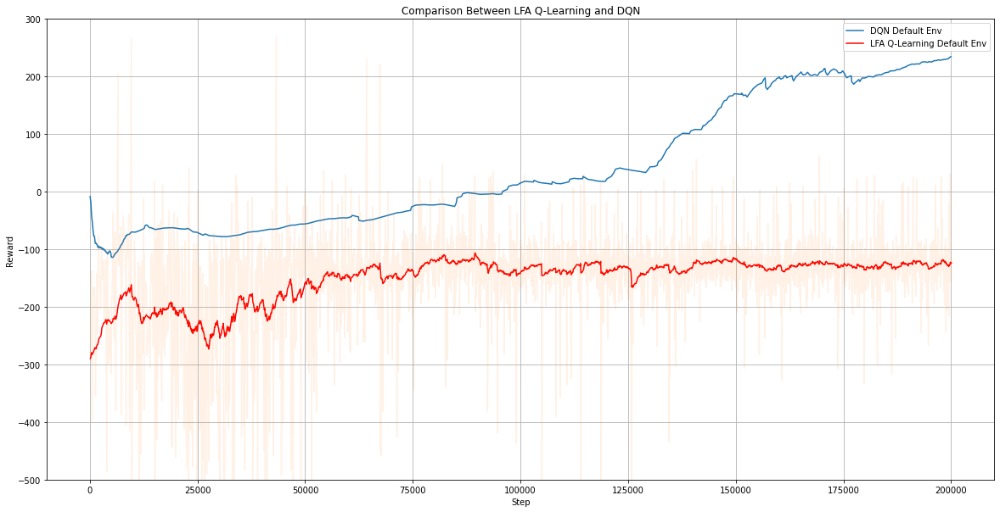

In [ ]:
plot_csv('Comparison Between LFA Q-Learning and DQN', 0.97, [('Default Environment/run-DQN_MlpPolicy_dueling_False_1-tag-episode_reward.csv', 'DQN Default Env')])

plt.plot(df_lfa_q_learning['Step'], smooth(df_lfa_q_learning['Value'], 0.97),color = 'r', label='LFA Q-Learning Default Env')
plt.plot(df_lfa_q_learning['Step'], df_lfa_q_learning['Value'], alpha=0.1)
plt.legend(loc='best')


## 8.3 DQN and A2C



Comparing the DQN method with the A2, we observe the superior performance of de off-policy model. While the A2C achieves the maximum reward below zero, the DQN model passed to return positive rewards near to 100000 steps. Furthermore, the DQN method continues growing the reward results, stabilizing near to +250.

In a search to observe a better result of the A2C model, we tested it in a continuous environment ('LunarLander_Continuous_v2'). As a result, the model performed worse than in the discrete problem.

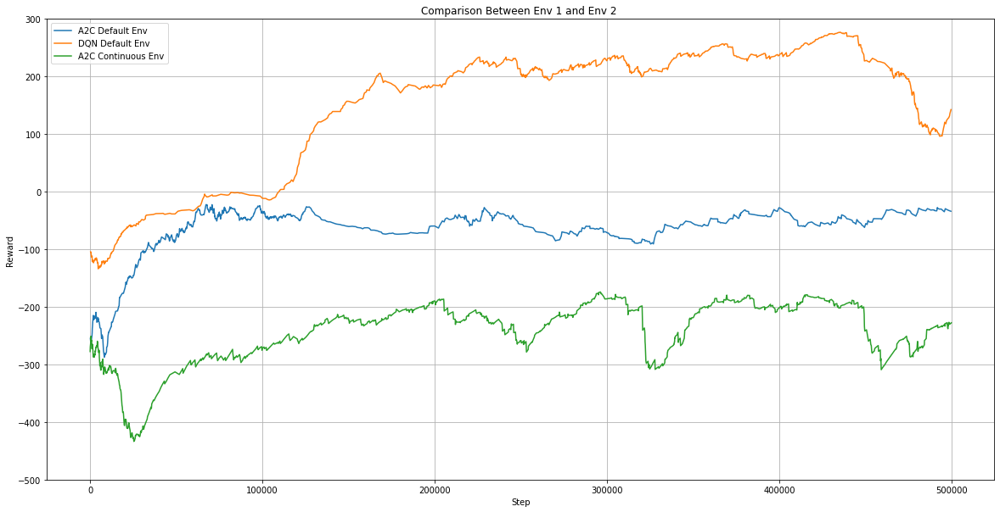

In [ ]:
plot_csv('Comparison Between Env 1 and Env 2 ', 0.97, [('500k Environment/A2C_500_reward.csv', 'A2C Default Env'), 
                               ('500k Environment/DQN_500_reward.csv', 'DQN Default Env'),
                               ('500k Environment/A2C_Continuous_500_reward.csv', 'A2C Continuous Env')
                              ])

How the methods present a similar reward after 200 000 steps, we chose this mark to train them for other comparisons.

DQN

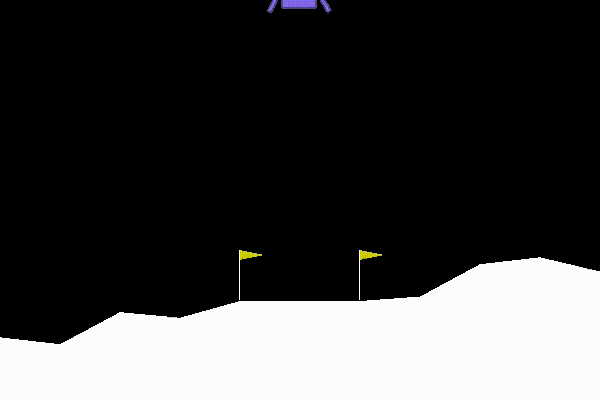

In [ ]:
Image(open('videos/gifs/DQN_record.gif','rb').read())

A2C

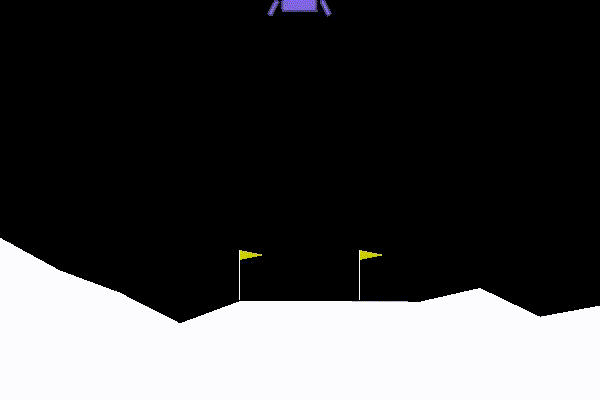

In [ ]:
Image(open('videos/gifs/A2C_record.gif','rb').read())

## 8.4 Resultados apresentados nos diferentes ambientes

### 8.4.1 Env 2 *(Gaussian noise in $x$  position, with $\mu=0$, and $\sigma=0.2$)*

In Environment 2, adding noise in x position, we can observe by the graph below that, in DQN method, the env2 resulted in worse performance compared to default environment, achieving a positive reward only in the last steps of the training. 

On the other hand, the A2C method presented a different result. The method in env2 provided a similar result as the default environment during all training. The advanced actor-critic method, different from DQN, contoured this noise in the x position, resulting in a similar reward.

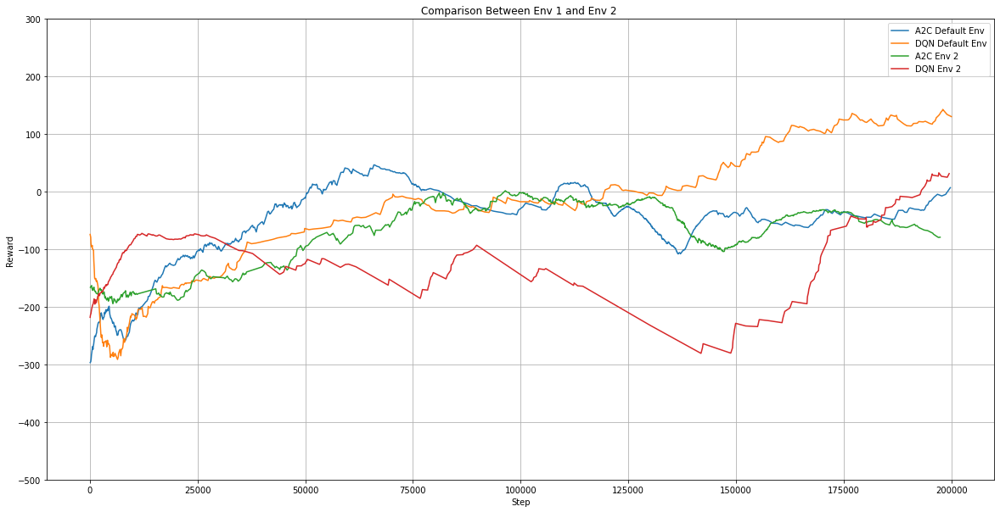

In [ ]:
plot_csv('Comparison Between Env 1 and Env 2 ', 0.97, [('Noise Environment/position_noise/A2C_reward.csv', 'A2C Default Env'), 
                               ('Noise Environment/position_noise/DQN_reward.csv', 'DQN Default Env'),
                               ('Noise Environment/position_noise/A2C_Noisy_reward.csv', 'A2C Env 2'), 
                               ('Noise Environment/position_noise/DQN_Noisy_reward.csv', 'DQN Env 2')
                              ])

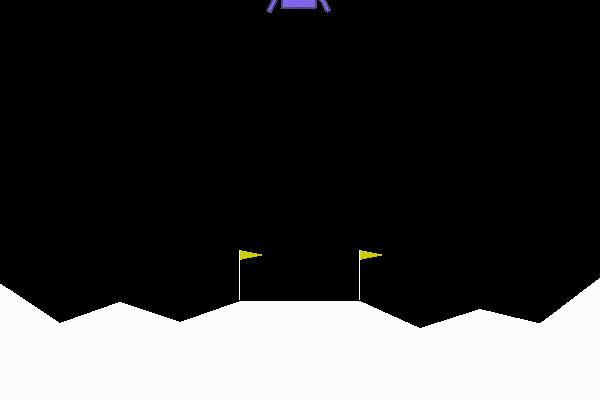

In [ ]:
Image(open('videos/gifs/env2dqn.gif','rb').read())

### 8.4.1 Env 3 *($70\%$ to $100\%$  $v_x$ real velocity)*

In this environment, with a knowledge of a random percent (between 70% and 100%) information of the real x velocity, provided distinct results. The A2C did not show a difference against its changes. However, the DQN model provided a better result in env 3, compared to default env.

The misinformation about the x Velocity provided a difficult training until 120000 steps. After that, it showed a growing reward curve, passing the Default environment.

This modification may provide a model more robust, that does not depend so much on the x velocity.

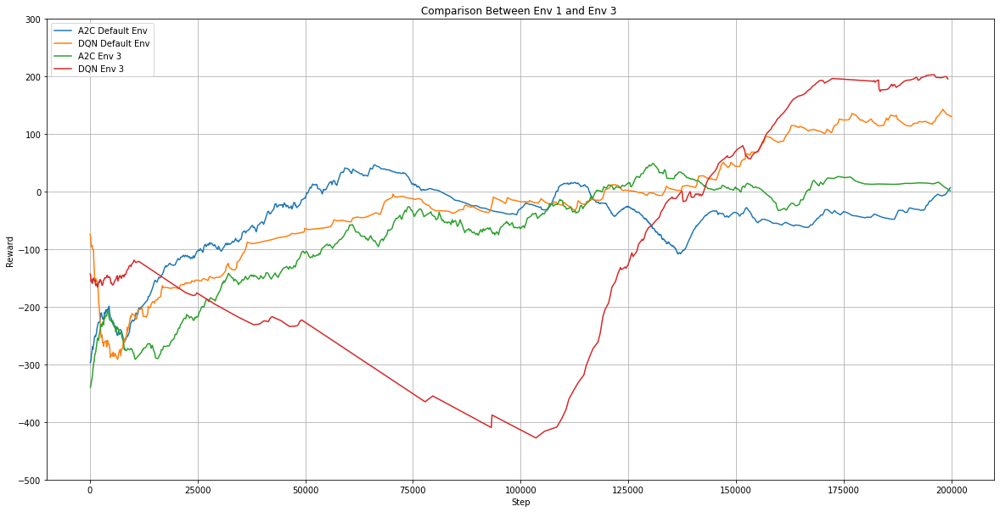

In [ ]:
plot_csv('Comparison Between Env 1 and Env 3 ', 0.97, [('Noise Environment/position_noise/A2C_reward.csv', 'A2C Default Env'), 
                               ('Noise Environment/position_noise/DQN_reward.csv', 'DQN Default Env'),
                               ('Noise Environment/velocity_noise/A2C_XVel70to100_reward.csv', 'A2C Env 3'),
                               ('Noise Environment/velocity_noise/DQN_XVel70to100_reward.csv', 'DQN Env 3')
                              ]) 
                               

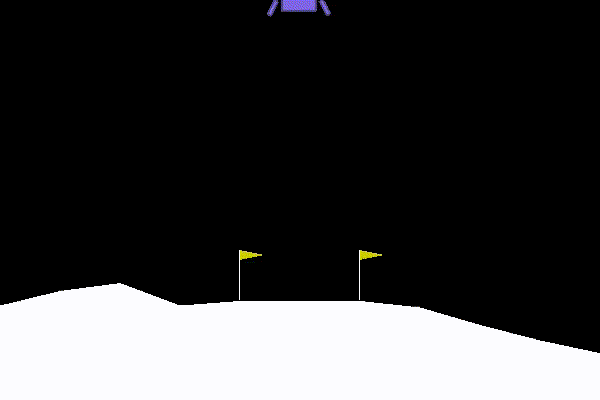

In [ ]:
Image(open('videos/gifs/env3dqn.gif','rb').read())

### 8.4.3 Env 4 *(engine reward set to -$0.6$)*

Seeking to penalize the use of the engine, this environment decreased the reward of this action. As a result, the methods did not show an expressive difference in reward evolution during the training. However, in the video, we can observe that the rocket aims to use the engine only near to the ground.

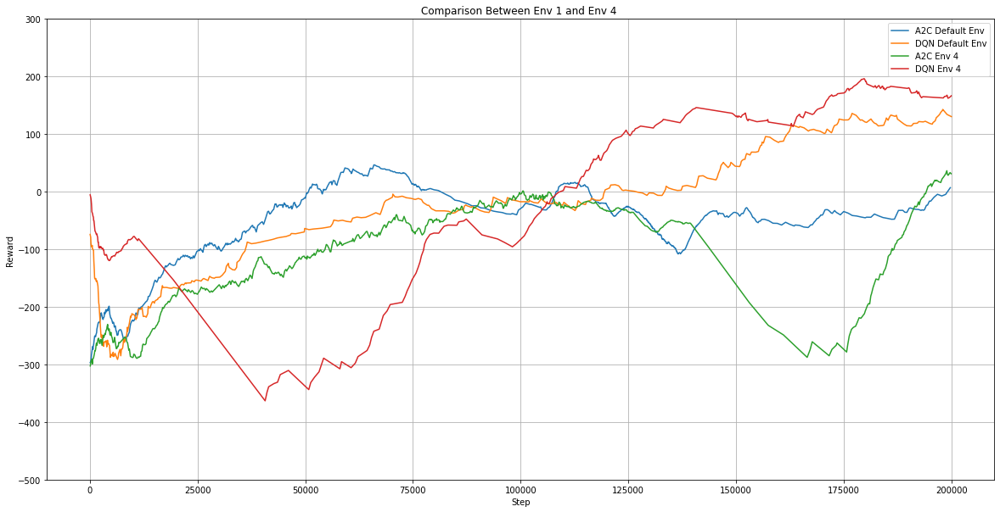

In [ ]:
plot_csv('Comparison Between Env 1 and Env 4 ', 0.97, [('Noise Environment/position_noise/A2C_reward.csv', 'A2C Default Env'), 
                               ('Noise Environment/position_noise/DQN_reward.csv', 'DQN Default Env'),
                               ('Noise Environment/reward_noise/A2C_NegReward_reward.csv', 'A2C Env 4'),
                               ('Noise Environment/reward_noise/DQN_NegReward_reward.csv', 'DQN Env 4')
                              ]) 

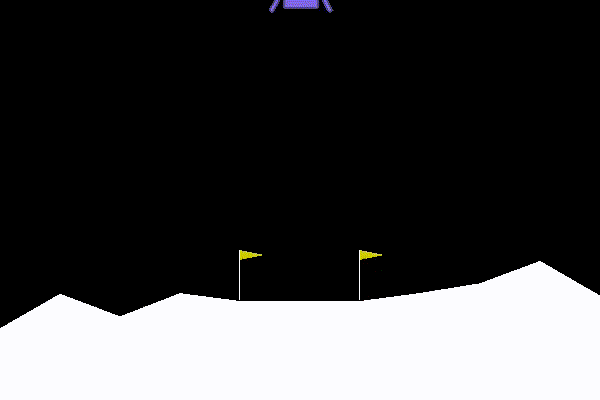

In [ ]:
Image(open('videos/gifs/env4dqn.gif','rb').read())

### 8.4.4 Env 5 *($20\%$ engine failure)*
In the environment where the engine fails with a 20% chance, DQN, despite obtaining bad results at the beginning of training, manages to evolve during the iterations, managing to adapt to this adversity and obtaining results superior to DQN in the default environment, however, the same does not happen with A2C, which despite to have better results, in the beginning, the agent is unable to evolve during training.

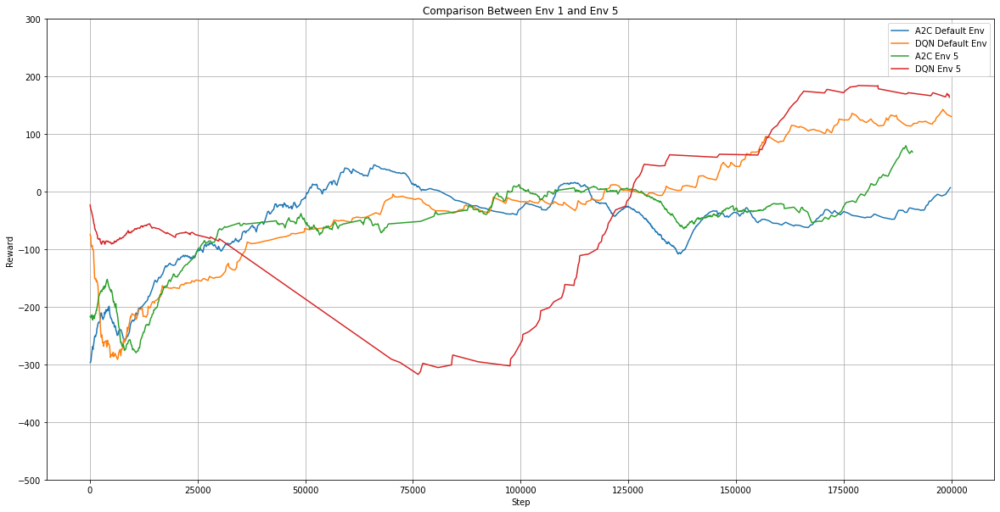

In [ ]:
plot_csv('Comparison Between Env 1 and Env 5', 0.97, [('Noise Environment/position_noise/A2C_reward.csv', 'A2C Default Env'), 
                               ('Noise Environment/position_noise/DQN_reward.csv', 'DQN Default Env'),
                                       ('Noise Environment/engine_noise/run-A2C_NOISE-tag-episode_reward.csv', 'A2C Env 5'), 
                               ('Noise Environment/engine_noise/run-DQN_NOISE-tag-episode_reward.csv', 'DQN Env 5')
                              ]) 

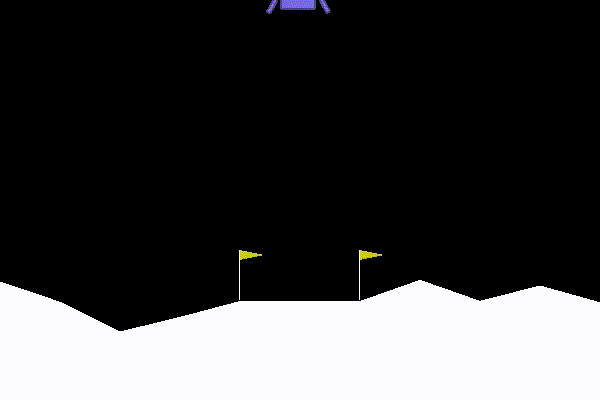

In [ ]:
Image(open('videos/gifs/env5_dqn.gif','rb').read())

### 8.4.5 Env 6 *($20\%$ engine failure with -$0.6$ engine reward)*


When added the greatest penalty in the use of the engine, the performance of the two agents is similar to the previous experiments. Highlighting the initial DQN performance, it presents a worse reward curve, that can be given due to the unpredictability of the engine together with the penalty considerably affects the exploitation of the agent.


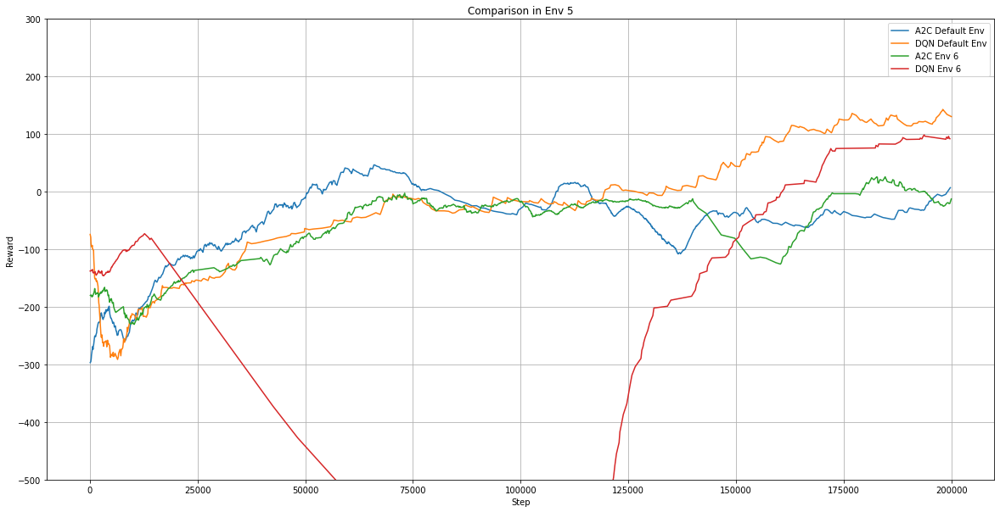

In [ ]:
plot_csv('Comparison in Env 5', 0.97, [('Noise Environment/position_noise/A2C_reward.csv', 'A2C Default Env'), 
                               ('Noise Environment/position_noise/DQN_reward.csv', 'DQN Default Env'),
                                       ('Noise Environment/engine_noise/run-A2C_negative_reward-tag-episode_reward.csv', 'A2C Env 6'), 
                               ('Noise Environment/engine_noise/run-DQN_negative_reward-tag-episode_reward.csv', 'DQN Env 6')
                              ]) 

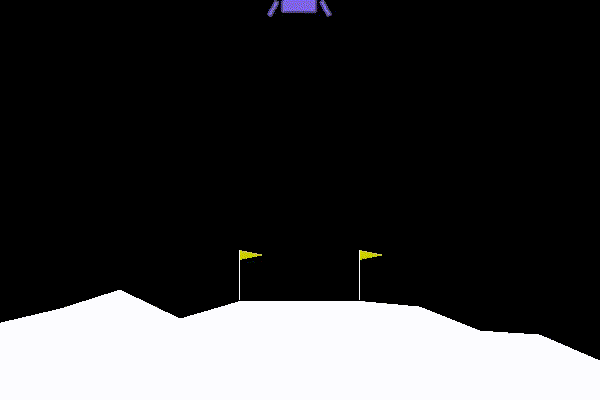

In [ ]:
Image(open('videos/gifs/env6dqn.gif','rb').read())

## 8.5 Análise dos resultados em relação aos métodos

### 8.5.1 DQN

Here we can see the results for two different policies (MLP with and without normalization) and with and without dueling.
The first graph shows the rewards for the standard DQN (not double) configurations. Although one can see some variance, specially between 50000 and 150000 episodes, the learning curves were similar. 
The same can be said about the Double DQN as shown below, except that in this case, at the end of 200 000 episodes, the reward are more scattered. Since the algorithms have some aleatory choices, the order may change slightly in different runs. So we cannot affirm that one configuration is better than others with only this experiment.


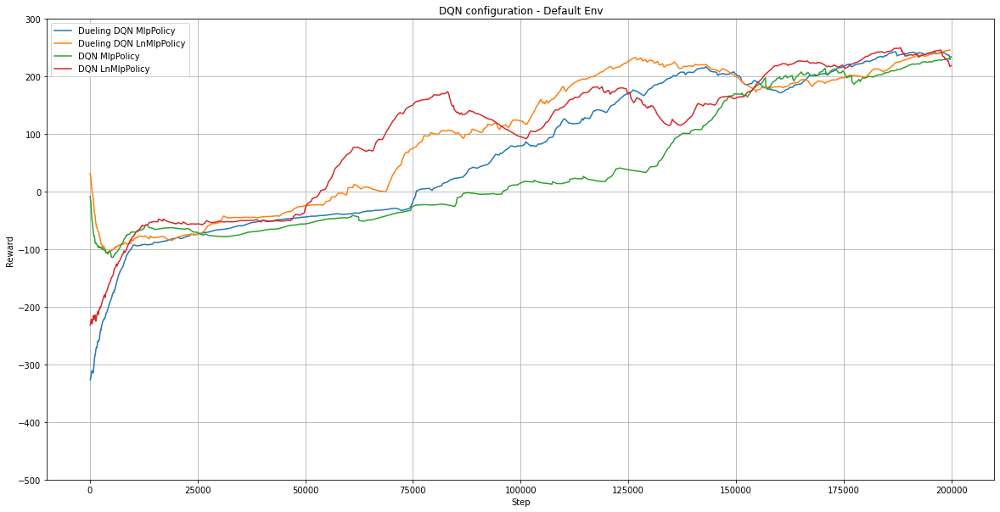

In [ ]:
plot_csv('DQN configuration - Default Env', 0.97, [('Default Environment/run-DQN_MlpPolicy_1-tag-episode_reward.csv', 'Dueling DQN MlpPolicy'), 
                               ('Default Environment/run-DQN_LnMlpPolicy_1-tag-episode_reward.csv', 'Dueling DQN LnMlpPolicy'),
                               ('Default Environment/run-DQN_MlpPolicy_dueling_False_1-tag-episode_reward.csv', 'DQN MlpPolicy'),
                               ('Default Environment/run-DQN_LnMlpPolicy_dueling_False_1-tag-episode_reward.csv', 'DQN LnMlpPolicy')
                              ])

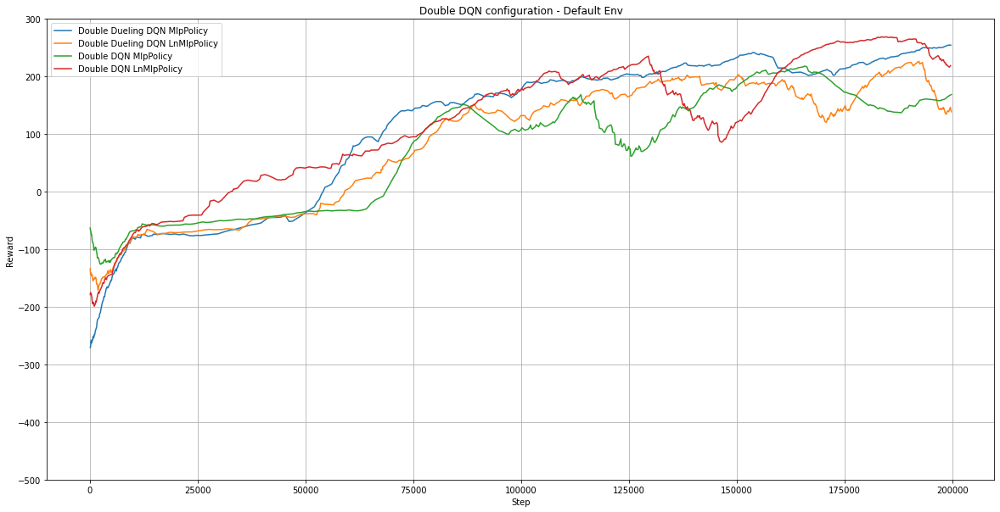

In [ ]:
plot_csv('Double DQN configuration - Default Env', 0.97, [('Default Environment/run-Double_DQN_MlpPolicy_1-tag-episode_reward.csv', 'Double Dueling DQN MlpPolicy'), 
                               ('Default Environment/run-Double_DQN_LnMlpPolicy_1-tag-episode_reward.csv', 'Double Dueling DQN LnMlpPolicy'),
                               ('Default Environment/run-Double_DQN_MlpPolicy_dueling_False_1-tag-episode_reward.csv', 'Double DQN MlpPolicy'),
                               ('Default Environment/run-Double_DQN_LnMlpPolicy_dueling_False_1-tag-episode_reward.csv', 'Double DQN LnMlpPolicy')
                              ])

### 8.5.2 A2C

#### Learning Rate
Concerning different values of the learning rate, as can be seen in the graphs, the agent-based on Actor-Critic obtained better results using the learning rate 0.007, where although in the initial iterations, it does not obtain better results than the agents with the learning rates 0.015 and 0.0007, the agent can improve his results, this is due to the exploratory behavior that this learning rate attributes to the agent, in comparison to the learning rate 0.0007, and to the more stable learning during training when compared to the agent with learning rate 0.015.

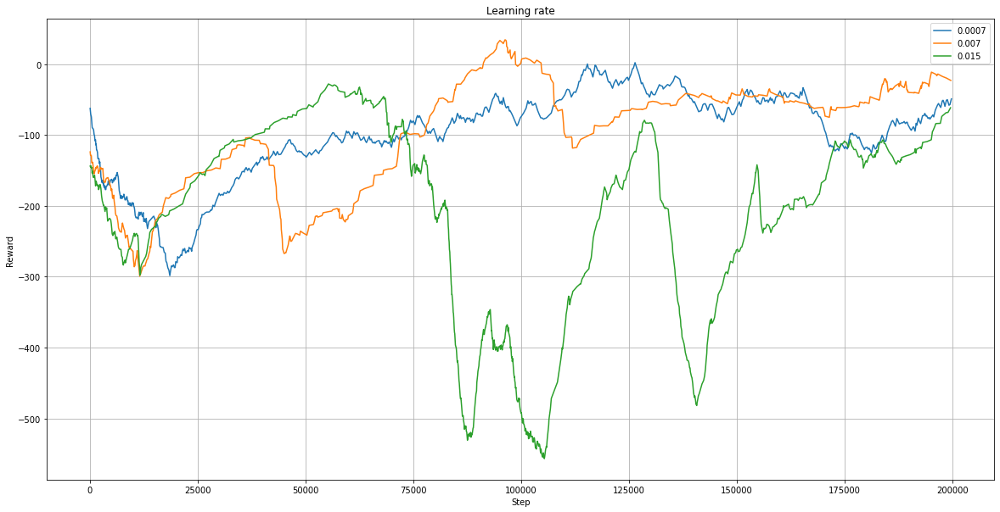

In [ ]:
plot_csv('Learning rate', 0.97, [('Default Environment/lr_a2c/run-A2C_0007-tag-episode_reward.csv', '0.0007'), 
                               ('Default Environment/lr_a2c/run-A2C_007-tag-episode_reward.csv', '0.007'), 
                               ('Default Environment/lr_a2c/run-A2C_015-tag-episode_reward.csv', '0.015')
                              ])

#### Learning rate Schedule
Regarding the approaches for Learning Rate Schedule for the agent-based on Actor-Critic, as can be seen in the graph, the agent obtained better results when the Schedule used is Constant, however, the difference between the two was not very significant, where, the main difference is in the peak obtained by the approaches, where the approach that uses the Constant approach manages to obtain higher reward values in the final iterations, and this can be given by the higher value of learning rate in these interactions in comparison with the Linear approach, resulting in further exploration of the agent

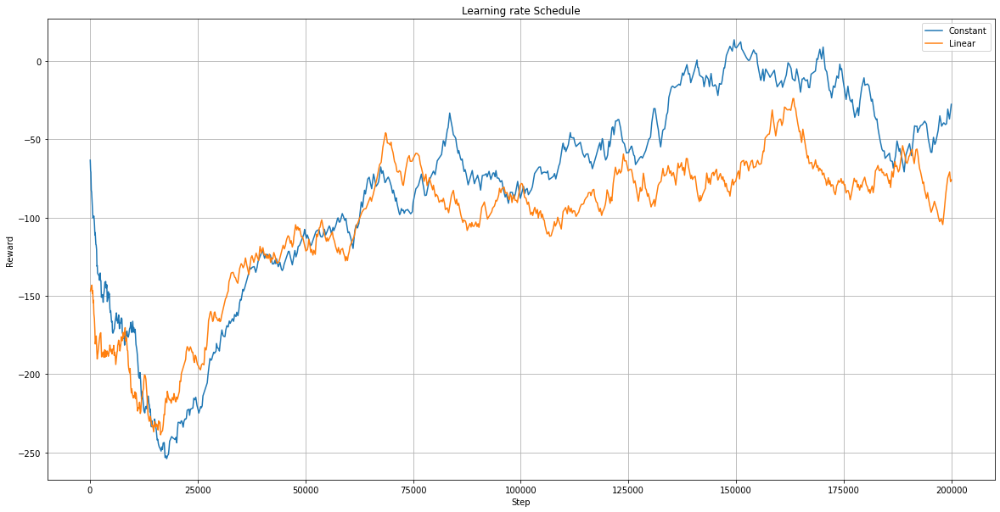

In [ ]:
plot_csv('Learning rate Schedule', 0.97, [('Default Environment/lr_schedules_a2c/run-A2C_Constant-tag-episode_reward.csv', 'Constant'), 
                               ('Default Environment/lr_schedules_a2c/run-A2C_Linear-tag-episode_reward.csv', 'Linear')
                              ])

#### Policy
For the policies used by the agent, as can be seen in the graph, the agent that uses LSTM together with an MLP with Layer normalization obtained a greater evolution in training, having a considerable increase in rewards, this model stands out for its robustness, since that it uses the sequence of actions to predict the new values, unlike the agent that uses only MLP, and also by Layer Normalizations, which reduces the variance of the model parameters, helping in the convergence of training, as can be seen in the difference between the agent who uses this model with the agent who does not use Layer Normalization, which shows worse results at the beginning of the training.

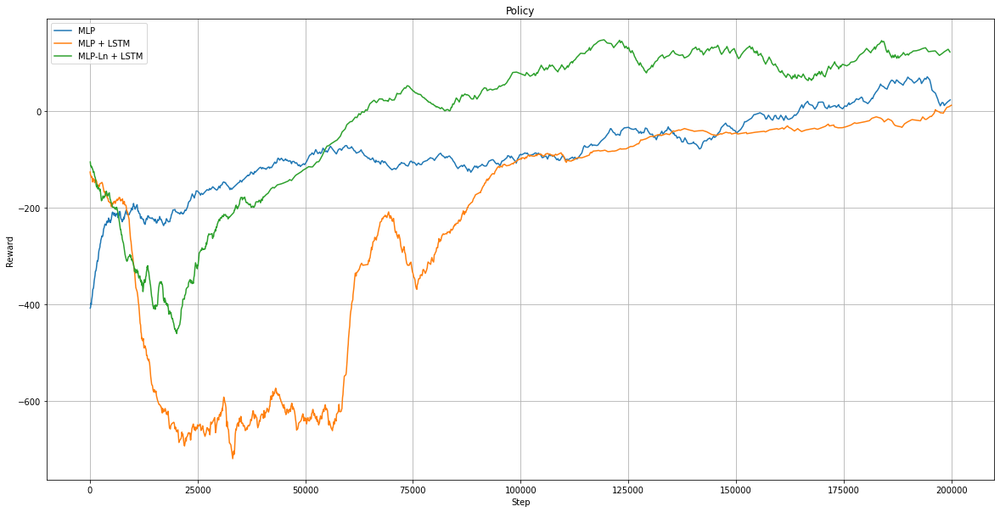

In [ ]:
plot_csv('Policy', 0.97, [('Default Environment/policy_a2c/run-A2C_MLP-tag-episode_reward.csv', 'MLP'), 
                               ('Default Environment/policy_a2c/run-A2C_MLP_LSTM-tag-episode_reward.csv', 'MLP + LSTM'), 
                               ('Default Environment/policy_a2c/run-A2C_MLP_LN_LSTM-tag-episode_reward.csv', 'MLP-Ln + LSTM'), 
                              ])

# 9 Lunar Lander Related Work

The lunar lander environment has some characteristics that makes it preferable for testing algorithms. Even though it is not the simplest available, changing the environment is straightforward. Also, it has continuous and discrete versions, which widens the range of applications.
For that reason, one can find academic papers solving lunar lander environment. For instance, in the work “Evolving network topology in policy gradient reinforcement learning algorithms”, the authors incorporate techniques for evolving neural network topologies in A2C method. In the paper “A control-model-based approach for reinforcement learning”, the authors implement a control-model-based algorithm that learns the optimal control parameters (different from the model-free approach adopted in our project which learns the dynamic of the agent in the environment). 
Moreover, for that same reason, one can find implementations that the authors aim just to check the performance of different algorithms. This is the case of the work "Solving the Lunar Lander problem under uncertainty using Reinforcement Learning" where the authors compare Sarsa with DQN in a modified lunar lander v2 environment which includes some uncertainties making the deterministic Markov decision process partially observable. This is also the case of "Yet Another Hindsight Experience Replay: Target Reached" where the author implements HER (Hindsight Experience Replay) algorithm and show its performance under different reward setup and final goal location of the spaceship. 


# 10 Conclusion and Future Work

In this project, we compare two reinforcement learning models, one off-policy, Deep Q-Network (DQN), and other on-policy, Advanced Actor Critic (A2C). It was done a comparison in 500K steps of learning, which the DQN method showed itself with better performance for the Lunar Lander environment.

Furthermore, this work presented the influence of the hyperparameters in each model. Additionally, the group proposes 6 environment modifications, testing both methods to observe their robustness.

For future work, we aim to use different neural networks, with more and different layers, such as Convolutional layers. Moreover, we seek to define limited fuel and limited landing time for new environment modifications.

# 11 Contribution

At this project, different from the first activity, we did not separate tasks for each team member. The whole group came together to suggest changes in the environments and suggestions for implementing the methods. Finally, the report and the video narrative was done by the suggestion and approvement of all group.  

# 12 Video

https://youtu.be/IruHk_f95kk